In [437]:
notebook_id = "220"

<a id="ID_top"></a>
## Adjacency matrix and network chart

This workflow takes live files and calls on functions in `script_adj_matrix_plot.py` to create adjancency matrices and network graph

#### Notebook sections:
    
|| [0|Top](#ID_top) || [1|Part1](#ID_part1) || [2|Part2](#ID_part2) || [3|Part3](#ID_part3) || [4|Part4](#ID_part4) || [5|Part5](#ID_part5) ||

### Packages

In [2]:
# %load s_package_import
# package library, use to ensure consistency across notebooks, refresh periodically
# general packages
import os # use with os.listdir(_path_)
import requests
import csv
import time
from datetime import datetime
from shutil import copyfile

#temp check
#from shutil import make_archive
import zipfile #notebook

# data analysis packages
import pandas as pd
pd.options.display.max_columns = None # don't truncate columns
#pd.options.display.max_rows = None

import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import descartes
import collections
#import pycountry

# custom scripts
import s_file_export
import s_filepaths
import s_un_comtrade_extract as s_un
import s_adj_matrix_plot

#=== network analysis
import networkx as nx
#=== gavity modelling
#import gme as gme

#=== distance datasets
#import wbdata


#### Import module and declare path variables
`import s_filepaths.py`

In [3]:
# import ref file
import s_filepaths

# declare local variables to work with
path_raw = s_filepaths.path_raw
path_raw_dl = s_filepaths.path_raw_dl
path_store = s_filepaths.path_store
path_live = s_filepaths.path_live
path_image = s_filepaths.path_images
path_analysis = s_filepaths.path_analysis
path_map = s_filepaths.path_map

<a id="ID_part2"></a>
### Part 2 | Load files and lightly process
|| [0|Top](#ID_top) || [1|Part1](#ID_part1) || [2|Part2](#ID_part2) || [3|Part3](#ID_part3) || [4|Part4](#ID_part4) || [5|Part5](#ID_part5) ||

**Scope file**<br>
Load scope file (125) to get list of countries previously analysed for consistency.

In [4]:
# Load scope files
os.listdir(path_live)
file_name_scope = "125_input_scope_country.csv.gzip"
df_scope = pd.read_csv(f"{path_live}/{file_name_scope}", compression = "gzip")

# create reference scope file
list_scope_iso3 = list(df_scope.iso3_d.unique())
print(f"There are {len(list_scope_iso3)} countries in the scope file.")

There are 70 countries in the scope file.


In [5]:
df_scope

,year,country_d,iso3_d,dynamic_code_d,landlocked_d,island_d,region_d,gdp_pwt_const_d,pop_d,lat_d,lng_d,country_o,iso3_o,dynamic_code_o,landlocked_o,island_o,region_o,pop_o,lat_o,lng_o,contiguity,distance,bri_year_d,bri_flag_d,economic_distance,institutional_distance,logistics,logistics_geo_distance,Import_value,rtCode,rt3ISO,ptCode,pt3ISO,Export_value
0,2016,United Arab Emirates,ARE,ARE,0,0,middle_east,NaN,NaN,25.094378,55.454674,Portugal,PRT,PRT,0,0,europe,NaN,39.310741,-10.883486,0,6154.42140,2017.0,1.0,32364.307560,0.403792,1.331108,8192.201100,2.183510e+08,620.0,PRT,784.0,ARE,1.794034e+08
1,2016,Belgium,BEL,BEL,0,0,europe,NaN,NaN,50.691814,4.581812,Cambodia,KHM,KHM,0,0,south_east_asia,NaN,12.320902,104.874400,0,9693.06250,NaN,NaN,44933.919861,4.775302,1.386359,13438.064434,3.670375e+08,116.0,KHM,56.0,BEL,3.968047e+08
2,2016,China,CHN,CHN,0,0,east_asia,NaN,NaN,35.389668,114.002470,Belarus,BLR,BLR,1,0,europe,NaN,53.604687,27.802185,0,6904.33640,2013.0,1.0,4153.131454,0.004938,1.492458,10304.432095,4.351889e+08,112.0,BLR,156.0,CHN,4.005118e+08
3,2016,Spain,ESP,ESP,0,0,europe,NaN,NaN,39.231297,-4.263840,Belgium,BEL,BEL,0,0,europe,NaN,50.691814,4.581812,0,1374.93510,NaN,NaN,11326.515268,1.841935,1.270506,1746.863638,7.757618e+09,56.0,BEL,724.0,ESP,1.049398e+10
4,2016,Georgia,GEO,GEO,0,0,europe,NaN,NaN,42.079079,42.981064,Iran,IRN,IRN,0,0,middle_east,NaN,33.925423,52.192562,0,1097.27990,2016.0,1.0,1153.061729,2.290772,1.630717,1789.352575,8.445334e+07,364.0,IRN,268.0,GEO,7.591084e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4825,2016,Vietnam,VNM,VNM.X,0,0,south_east_asia,NaN,NaN,15.463247,106.562180,Turkey,TUR,TUR,0,0,eurasia,NaN,39.124500,34.841019,0,7749.51270,2017.0,1.0,19756.263831,0.427914,1.449960,11236.481497,1.713836e+08,792.0,TUR,704.0,VNM,2.338751e+08
4826,2016,Vietnam,VNM,VNM.X,0,0,south_east_asia,NaN,NaN,15.463247,106.562180,Laos,LAO,LAO,1,0,south_east_asia,NaN,18.160072,103.741520,1,777.79956,2017.0,1.0,270.465244,0.820002,1.619515,1259.657763,3.471125e+08,418.0,LAO,704.0,VNM,5.380665e+08
4827,2016,Vietnam,VNM,VNM.X,0,0,south_east_asia,NaN,NaN,15.463247,106.562180,Finland,FIN,FIN,0,0,europe,NaN,62.738297,25.585251,0,8296.92380,2017.0,1.0,38356.812439,4.415100,1.387828,11514.705238,2.248366e+08,246.0,FIN,704.0,VNM,1.418590e+08
4828,2016,Vietnam,VNM,VNM.X,0,0,south_east_asia,NaN,NaN,15.463247,106.562180,Serbia,SRB,SRB.X,1,0,europe,NaN,44.679684,20.506792,0,8689.12110,2017.0,1.0,9161.236550,0.213198,1.532599,13316.940481,NaN,688.0,SRB,704.0,VNM,1.224112e+07


**Load route level data for processing**<br>
Load input route (rail) data preprocessed from QGIS, fill missing values and re-export to shp file for analysis

Route network (shape file to geopandas)

In [175]:
# list of all files
print(os.listdir(path_map))

['ne_10m_railroads_europe_asia', '220b_routes_clean.cpg', '220b_routes_clean.shp', 'ne_10m_railroads', '220b_routes_clean.shx', '220_routes_diagnose.shx', '.DS_Store', '220_routes_clean.dbf', '220_routes_diagnose.cpg', '220_routes_diagnose.shp', 'ne_50m_admin_europe_asia_trim', '220_routes_clean.shx', 'ne_50m_admin_europe_asia', '220_routes_diagnose.dbf', 'ne_10m_admin_0_sovereignty', '220_routes_clean.cpg', '220b_routes_diagnose.prj', '220_routes_clean.shp', 'test_CHN_rrd', '220b_routes_clean.dbf', '220b_routes_clean.prj', 'ne_10m_populated_places', 'eu_asia_rail_country_joint_layer', '220b_routes_diagnose.dbf', 'ne_50m_admin_0_countries', '220_routes_diagnose.prj', 'test_mini', '220b_routes_diagnose.shx', '220b_routes_diagnose.shp', '220b_routes_diagnose.cpg', '220_routes_clean.prj', 'ne_10m_eu_asia_length', 'CH_RU_KZ_Test', 'live_dataset']


In [176]:
# Load shape file folder
folder = "live_dataset"
print(os.listdir(f"{path_map}/{folder}"))
file = "eurasia_simple.shp" # from list below insert file to load
full_path = f"{path_map}/{folder}/{file}"

['.DS_Store', 'eurasia_simple.prj', 'eurasia_simple.qpj', 'eurasia_simple.dbf', 'eurasia_simple.shp', 'eurasia_simple.cpg', 'eurasia_simple.shx']


Fill in blank values with a defined `filler term`

In [177]:
gdf_routes = gpd.read_file(full_path)
# in case there are unassigned values (except None for border crossings)
try:
    filler_term = "Cross_border"
    gdf_routes.ADMIN.fillna(filler_term,inplace = True)
    gdf_routes.ADM0_A3.fillna(filler_term,inplace = True)
except:
    pass
gdf_routes.head()

,rwdb_rr_id,featurecla,continent,length,ADMIN,ADM0_A3,CONTINENT_,NAME_EN,geometry
0,22588,Railroad,Asia,1857.297457,Vietnam,VNM,Asia,Vietnam,"LINESTRING (103.98167 22.53056, 103.96694 22.5..."
1,22591,Railroad,Asia,2851.559849,Vietnam,VNM,Asia,Vietnam,"LINESTRING (103.97947 22.50575, 103.98167 22.5..."
2,22702,Railroad,Asia,154407.264953,Vietnam,VNM,Asia,Vietnam,"LINESTRING (105.01750 21.54889, 103.97947 22.5..."
3,22703,Railroad,Asia,10526.730557,Vietnam,VNM,Asia,Vietnam,"LINESTRING (105.80194 21.60167, 105.86917 21.5..."
4,22706,Railroad,Asia,91532.355892,Vietnam,VNM,Asia,Vietnam,"LINESTRING (106.70917 21.97632, 106.29972 21.4..."


In [9]:
# get unique list of iso3 entries as a list
list_route_iso3 = list(gdf_routes.ADM0_A3.unique())

**Compare scope to data**

In [10]:
list_exclude = list(set(list_route_iso3) - set(list_scope_iso3))
print(f"Countries not in common: {list_exclude}")

Countries not in common: ['SVN', 'KOR', 'IRL', 'LKA', 'JPN', 'Cross_border', 'SYR', 'GBR', 'AZE', 'TWN', 'PHL', 'KOS', 'PRK']


Go through each country iso3 code and create a dataframe (row) index list to drop from the shapefile geodataframe.
<br>
**specific condition (IF)** to _not_ drop our `filler term`

In [11]:
list_index_exclude = []
for entry in list_exclude:
    if entry ==filler_term:
        print(f"Skipping filler term: {filler_term}")
    else:
        
        list_index_exclude = list_index_exclude + list(gdf_routes[gdf_routes.ADM0_A3 == entry].index.values)
        
        #list_index_exclude.append(gdf_routes[gdf_routes.ADM0_A3 == entry].index.values)

Skipping filler term: Cross_border


**Exclude countries out of scope from route dataframe**

In [12]:
gdf_routes_clean = gdf_routes.drop(list_index_exclude).copy()
print(gdf_routes_clean.shape)
gdf_routes_clean.head()

(20528, 9)


,rwdb_rr_id,featurecla,continent,length,ADMIN,ADM0_A3,CONTINENT_,NAME_EN,geometry
0,22588,Railroad,Asia,1857.297457,Vietnam,VNM,Asia,Vietnam,"LINESTRING (103.98167 22.53056, 103.96694 22.5..."
1,22591,Railroad,Asia,2851.559849,Vietnam,VNM,Asia,Vietnam,"LINESTRING (103.97947 22.50575, 103.98167 22.5..."
2,22702,Railroad,Asia,154407.264953,Vietnam,VNM,Asia,Vietnam,"LINESTRING (105.01750 21.54889, 103.97947 22.5..."
3,22703,Railroad,Asia,10526.730557,Vietnam,VNM,Asia,Vietnam,"LINESTRING (105.80194 21.60167, 105.86917 21.5..."
4,22706,Railroad,Asia,91532.355892,Vietnam,VNM,Asia,Vietnam,"LINESTRING (106.70917 21.97632, 106.29972 21.4..."


**Figure |** Number of edges by country, to get an idea of density by country.

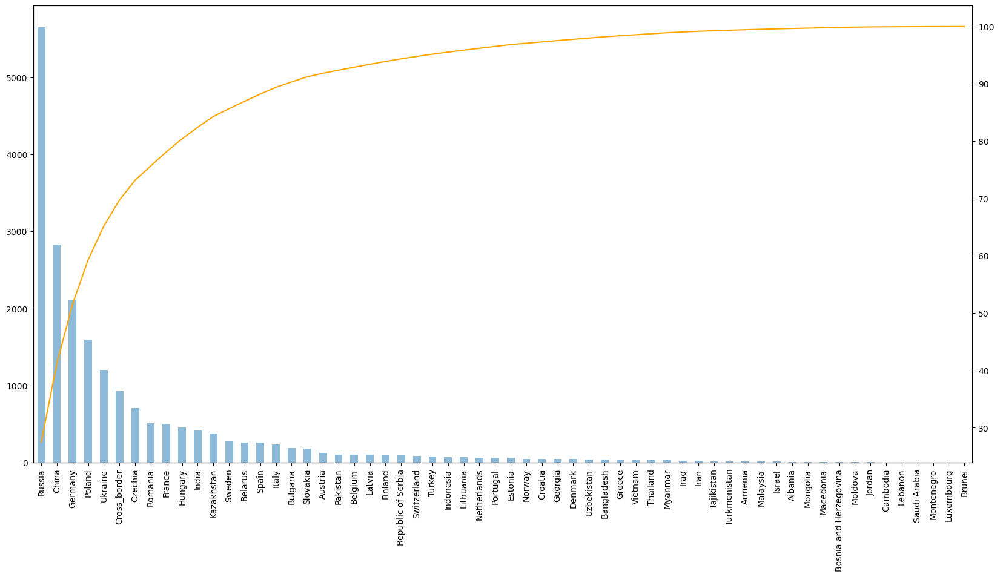

In [13]:
fig,ax = plt.subplots(figsize = (20,10), dpi = 100)
gdf_routes_clean['ADMIN'].value_counts().plot(kind = 'bar',ax = ax,alpha = 0.5)
ax2 = ax.twinx()
temp_data = gdf_routes_clean['ADMIN'].value_counts().copy()
temp_data = temp_data.cumsum() / temp_data.sum() * 100
temp_data.plot(kind= "line", c = "orange", ax = ax2)

Cumulative plot of the above

**Merge dataframes to calculate new distance column**

In [14]:
file_to_read = f"{path_raw}121_raw_wb_distance_2016_extra.csv.gzip"
df_temp_lpi = pd.read_csv(file_to_read,compression = "gzip",index_col = "index")
df_temp_lpi.head()

,Control of corruption,Government effectiveness,Political Stability and Absence of Violence,Rule of Law,Regulatory Quality,Voice and Accountability,GDP per capita (PPP),Logistics Performance Index,LPI_adjusted
index,,,,,,,,,
ARE,1.171709,1.415928,0.564749,0.849041,0.972596,-1.050421,63968.853871,3.941767,1.264558
BEL,1.638705,1.326213,0.441367,1.390965,1.340684,1.376962,48608.957782,4.108538,1.222866
CHN,-0.254059,0.354875,-0.499395,-0.334415,-0.264475,-1.561287,13572.620725,3.661104,1.334724
CZE,0.536757,1.036739,0.976116,1.035502,0.986401,1.024769,35876.727438,3.674309,1.331423
ESP,0.515630,1.115842,0.413188,0.978825,1.008604,1.041046,37282.442513,3.727412,1.318147


**Prepare dataframe for export**

In [15]:
# merge data frames
gdf_export = gdf_routes_clean.merge(df_temp_lpi.loc[:,"LPI_adjusted"],how = "left",left_on = "ADM0_A3", right_index = True).copy()

gdf_export.loc[:,"LPI_adjusted"] = gdf_export.loc[:,"LPI_adjusted"].fillna(1)
gdf_export["length_lpi"] = gdf_export.loc[:,"LPI_adjusted"] * gdf_export.loc[:,"length"]

In [16]:
# sample gdf
#gdf_export = gdf_routes_clean.copy()

In [17]:
#(122.20694416666664, 48.43333333333333)
gdf_export.head(5)

,rwdb_rr_id,featurecla,continent,length,ADMIN,ADM0_A3,CONTINENT_,NAME_EN,geometry,LPI_adjusted,length_lpi
0,22588,Railroad,Asia,1857.297457,Vietnam,VNM,Asia,Vietnam,"LINESTRING (103.98167 22.53056, 103.96694 22.5...",1.505843,2796.797911
1,22591,Railroad,Asia,2851.559849,Vietnam,VNM,Asia,Vietnam,"LINESTRING (103.97947 22.50575, 103.98167 22.5...",1.505843,4294.000725
2,22702,Railroad,Asia,154407.264953,Vietnam,VNM,Asia,Vietnam,"LINESTRING (105.01750 21.54889, 103.97947 22.5...",1.505843,232513.060477
3,22703,Railroad,Asia,10526.730557,Vietnam,VNM,Asia,Vietnam,"LINESTRING (105.80194 21.60167, 105.86917 21.5...",1.505843,15851.600890
4,22706,Railroad,Asia,91532.355892,Vietnam,VNM,Asia,Vietnam,"LINESTRING (106.70917 21.97632, 106.29972 21.4...",1.505843,137833.334510


**EXPORT**

In [18]:
filename = "routes_clean"
path_file_live = f"{path_map}{notebook_id}_{filename}.shp"
gdf_export.to_file(path_file_live)

<a id="ID_part3"></a>
### Part 3 | Load clean data and analyse
|| [0|Top](#ID_top) || [1|Part1](#ID_part1) || [2|Part2](#ID_part2) || [3|Part3](#ID_part3) || [4|Part4](#ID_part4) || [5|Part5](#ID_part5) ||

**Load country base layer for visualisation**

In [242]:
# Load shape file folder
folder = "ne_10m_admin_0_sovereignty"
print(os.listdir(f"{path_map}/{folder}"))
file = "ne_10m_admin_0_sovereignty.shp" # from list below insert file to load
full_country_path = f"{path_map}/{folder}/{file}"

gdf_countries = gpd.read_file(full_country_path)

['ne_10m_admin_0_sovereignty.VERSION.txt', 'ne_10m_admin_0_sovereignty.prj', 'ne_10m_admin_0_sovereignty.shx', 'ne_10m_admin_0_sovereignty.cpg', 'ne_10m_admin_0_sovereignty.shp', 'ne_10m_admin_0_sovereignty.README.html', 'ne_10m_admin_0_sovereignty.dbf']


In [245]:
gdf_countries.loc[:,"CONTINENT"].unique()

array(['Asia', 'South America', 'Europe', 'Africa', 'North America',
       'Oceania', 'Antarctica', 'Seven seas (open ocean)'], dtype=object)

In [246]:
gdf_countries = gdf_countries[(gdf_countries.CONTINENT == "Asia") | (gdf_countries.CONTINENT == "Europe")].copy()

**Load trimmed shape_file**

In [19]:
# load shapefile into network
route_shp_load = nx.read_shp(path_file_live,geom_attrs=True)

In [20]:
# network basics
print("Nodes: ",len(route_shp_load.nodes()))
print("Edges: ", len(route_shp_load.edges()))

Nodes:  17449
Edges:  20454


In [21]:
gdf_shp_load = gpd.read_file(path_file_live)
gdf_shp_load.head()

,rwdb_rr_id,featurecla,continent,length,ADMIN,ADM0_A3,CONTINENT_,NAME_EN,LPI_adjust,length_lpi,geometry
0,22588,Railroad,Asia,1857.297457,Vietnam,VNM,Asia,Vietnam,1.505843,2796.797911,"LINESTRING (103.98167 22.53056, 103.96694 22.5..."
1,22591,Railroad,Asia,2851.559849,Vietnam,VNM,Asia,Vietnam,1.505843,4294.000725,"LINESTRING (103.97947 22.50575, 103.98167 22.5..."
2,22702,Railroad,Asia,154407.264953,Vietnam,VNM,Asia,Vietnam,1.505843,232513.060477,"LINESTRING (105.01750 21.54889, 103.97947 22.5..."
3,22703,Railroad,Asia,10526.730557,Vietnam,VNM,Asia,Vietnam,1.505843,15851.600890,"LINESTRING (105.80194 21.60167, 105.86917 21.5..."
4,22706,Railroad,Asia,91532.355892,Vietnam,VNM,Asia,Vietnam,1.505843,137833.334510,"LINESTRING (106.70917 21.97632, 106.29972 21.4..."


**Add extra fields to our data frame**<br>
These fields allow us to keep track of edge and node IDs 

In [22]:
# keep track of nodes and edges
# Take geometry and create 'node' columns
from shapely import wkt # in case we didn't import earlier

# series for new columns
list_node_1 = []
list_node_2 = []
list_node_key = []

for entry in gdf_shp_load.geometry:
    
    # full string for row
    full_string = wkt.dumps(entry, trim = False)
    
    # clean up string
    temp_str = full_string.replace("LINESTRING ","")
    temp_str = temp_str.replace("(","")
    temp_str = temp_str.replace(")","")
    temp_str = temp_str.replace(",","")
    #print(temp_str)
    temp_str_values = temp_str.split(" ")
    temp_node1 = (float(temp_str_values[0]),float(temp_str_values[1]))
    temp_node2 = (float(temp_str_values[2]),float(temp_str_values[3]))
    temp_node_key = (temp_node1,temp_node2)
    #print(temp_node1)
    #print(temp_node2)
    list_node_1.append(temp_node1)
    list_node_2.append(temp_node2)
    list_node_key.append(temp_node_key)
    
# add to dataframe
gdf_shp_load["node_1_position"] = list_node_1
gdf_shp_load["node_2_position"] = list_node_2
gdf_shp_load["edge_key"] = list_node_key
gdf_shp_load["node_1_id"] = "empty"
gdf_shp_load["node_2_id"] = "empty"
gdf_shp_load["edge_id"] = "empty"

In [23]:
# previse dataframe without column 11 (it takes too lines to view and is the geometry field)
gdf_shp_load.iloc[:,[0,1,2,3,4,5,6,7,9,10,12,13,14]].tail()

,rwdb_rr_id,featurecla,continent,length,ADMIN,ADM0_A3,CONTINENT_,NAME_EN,length_lpi,geometry,node_2_position,edge_key,node_1_id
20523,23514,Railroad,Asia,155087.057569,Cross_border,Cross_border,None,None,155087.057569,"LINESTRING (103.84227 1.28727, 103.07792 2.33128)","(103.0779211111111, 2.331280833333333)","((103.84226972222221, 1.2872738888888888), (10...",empty
20524,23622,Railroad,Asia,8384.202544,Cross_border,Cross_border,None,None,8384.202544,"LINESTRING (112.72750 -7.09611, 112.74556 -7.0...","(112.74555527777777, -7.026666944444444)","((112.72749916666666, -7.0961108333333325), (1...",empty
20525,23630,Railroad,Asia,6642.584020,Cross_border,Cross_border,None,None,6642.584020,"LINESTRING (112.72750 -7.09611, 112.72889 -7.1...","(112.72888888888887, -7.155833888888888)","((112.72749916666666, -7.0961108333333325), (1...",empty
20526,23637,Railroad,Asia,98042.157923,Cross_border,Cross_border,None,None,98042.157923,"LINESTRING (113.49305 -7.17611, 112.72750 -7.0...","(112.72749916666666, -7.0961108333333325)","((113.493055, -7.176110833333333), (112.727499...",empty
20527,18479,Railroad ferry,Asia,25533.334744,Cross_border,Cross_border,None,None,25533.334744,"LINESTRING (140.35247 41.24870, 140.22305 41.4...","(140.22305416666666, 41.45666666666666)","((140.35247047496802, 41.2486984752703), (140....",empty


**Create network v1**<br>
create nodes and edges based on shp file in provisional network

In [24]:
# add edges
list_of_edges =[x for x in route_shp_load.edges()] # amended version without the set to see what happens
# positions
positions = {k: v for k,v in enumerate(route_shp_load.nodes())}

**Fill out missing cells in table**<br>
Use dummy network to get node IDs and edge IDs to complete the table

In [25]:
time_start = time.time() # timer start

positions = {}

for index,node_pos in enumerate(route_shp_load.nodes()):
    
    try:
        # filter data frame to get list of indeces for | node 1
        temp_node_1_index = list(gdf_shp_load[gdf_shp_load.node_1_position == node_pos].index)
        # assign position id value to new node_id column | node 1
        gdf_shp_load.iloc[temp_node_1_index,-3] = index
    except:
        pass
        
    # repeate above for node 2
    try:
        temp_node_2_index = list(gdf_shp_load[gdf_shp_load.node_2_position == node_pos].index)
        gdf_shp_load.iloc[temp_node_2_index,-2] = index
    except:
        pass
    
    # for testing only (hard stop)
    #if index == 10:
     #   break
    #else:
     #   pass
    
    
    # here is where we can change the names!
    positions.update({index : node_pos})
    
time_end = time.time()
duration = time_end - time_start
print(f"This task took: {duration/60}")

This task took: 2.389817504088084


In [26]:
time_start = time.time() # timer start

edge_id_list = []
for element in np.arange(0,len(gdf_shp_load)):
    temp_tuple = (gdf_shp_load.iloc[element,:].node_1_id,gdf_shp_load.iloc[element,:].node_2_id)
    edge_id_list.append(temp_tuple)
    #print(temp_tuple)
gdf_shp_load["edge_id"] = edge_id_list

time_end = time.time()
duration = time_end - time_start
print(f"This task took: {duration/60}")

This task took: 0.09756611585617066


In [27]:
time_start = time.time()
# translate list of edges into the node names to generate a adjecency list
list_of_named_edges = []

for i,edge in enumerate(list_of_edges):
    temp_tuple = ["",""]
        
    for index,tuple_coordinate in enumerate(edge):    
        
        for name,pos_coord in positions.items():
            
            if tuple_coordinate == pos_coord:
                temp_tuple[index] = name
          
    # possibility to drop an edge if it is equal to itself (circlular reference)
    assign = (temp_tuple[0],temp_tuple[1])
    list_of_named_edges.append(assign)
    #print(i,edge)
    #df_temp_index = gdf_shp_load[gdf_shp_load.edge_key == edge].edge_id.index[0]
    #gdf_shp_load.loc[df_temp_index,"edge_id"] = str(assign)

time_end = time.time()
duration = time_end - time_start
print(f"\tThis task took: {duration/60}")

	This task took: 2.5890965700149535


In [28]:
# view updated dataframe
gdf_shp_load.iloc[:,[0,1,2,3,4,5,6,7,9,10,12,13,14]].tail()

,rwdb_rr_id,featurecla,continent,length,ADMIN,ADM0_A3,CONTINENT_,NAME_EN,length_lpi,geometry,node_2_position,edge_key,node_1_id
20523,23514,Railroad,Asia,155087.057569,Cross_border,Cross_border,None,None,155087.057569,"LINESTRING (103.84227 1.28727, 103.07792 2.33128)","(103.0779211111111, 2.331280833333333)","((103.84226972222221, 1.2872738888888888), (10...",17444
20524,23622,Railroad,Asia,8384.202544,Cross_border,Cross_border,None,None,8384.202544,"LINESTRING (112.72750 -7.09611, 112.74556 -7.0...","(112.74555527777777, -7.026666944444444)","((112.72749916666666, -7.0961108333333325), (1...",17445
20525,23630,Railroad,Asia,6642.584020,Cross_border,Cross_border,None,None,6642.584020,"LINESTRING (112.72750 -7.09611, 112.72889 -7.1...","(112.72888888888887, -7.155833888888888)","((112.72749916666666, -7.0961108333333325), (1...",17445
20526,23637,Railroad,Asia,98042.157923,Cross_border,Cross_border,None,None,98042.157923,"LINESTRING (113.49305 -7.17611, 112.72750 -7.0...","(112.72749916666666, -7.0961108333333325)","((113.493055, -7.176110833333333), (112.727499...",17448
20527,18479,Railroad ferry,Asia,25533.334744,Cross_border,Cross_border,None,None,25533.334744,"LINESTRING (140.35247 41.24870, 140.22305 41.4...","(140.22305416666666, 41.45666666666666)","((140.35247047496802, 41.2486984752703), (140....",17238


In [29]:
# if any nodes / edges do not have a key, drop them
gdf_error_nodes =gdf_shp_load[(gdf_shp_load.node_1_id == "empty") | (gdf_shp_load.node_2_id == "empty")].copy()
gdf_error_nodes.drop(["node_1_position","node_2_position","edge_key","edge_id"],axis = 1,inplace =True)
filename = "routes_diagnose"
path_file_live = f"{path_map}{notebook_id}_{filename}.shp"
gdf_error_nodes.to_file(path_file_live)

**Create network v2**<br>
Extract position IDs and edges IDs

In [30]:
# empty graph
new_graph = nx.Graph()

# add nodes based on the above positions
new_graph.add_nodes_from(positions.keys())

# add edges to our new graph
new_graph.add_edges_from(list_of_named_edges)

**new network** metadata

In [31]:
dict_country = {}
dict_length = {}
dict_length_lpi = {}
dict_rail_id = {}
dict_df_index = {}

for element in np.arange(0,len(gdf_shp_load)):
    temp_row = gdf_shp_load.iloc[element,:]
    temp_edge_id = temp_row.edge_id
    #print(element,temp_edge_id)
    
    temp_country = temp_row.ADM0_A3
    temp_length = temp_row.length
    temp_length_lpi = temp_row.length_lpi
    temp_rail_id = temp_row.rwdb_rr_id
    if "empty" in temp_edge_id:
        #print(element,"skipped")
        pass
    else:
        dict_country.update({temp_edge_id : temp_country})
        dict_length.update({temp_edge_id : temp_length})
        dict_length_lpi.update({temp_edge_id : temp_length_lpi})
        dict_rail_id.update({temp_edge_id : temp_rail_id})
        dict_df_index.update({temp_edge_id : element})

In [35]:
# add attributes
nx.set_edge_attributes(new_graph,dict_country,"iso3")
nx.set_edge_attributes(new_graph,dict_length,"dg")
nx.set_edge_attributes(new_graph,dict_length_lpi,"dgl")
nx.set_edge_attributes(new_graph,dict_rail_id,"rail_id")
nx.set_edge_attributes(new_graph,dict_df_index,"df_index")

In [258]:
# Visualise (originla code)
#plt.figure(1,figsize = (40,20),dpi = 200)
#nx.draw_networkx_nodes(new_graph,positions,node_size=1,node_color='b',alpha = 0.1)
#nx.draw_networkx_edges(new_graph,positions)

-19.30659725 188.81798669444444
-12.135426777777777 73.49674622222221


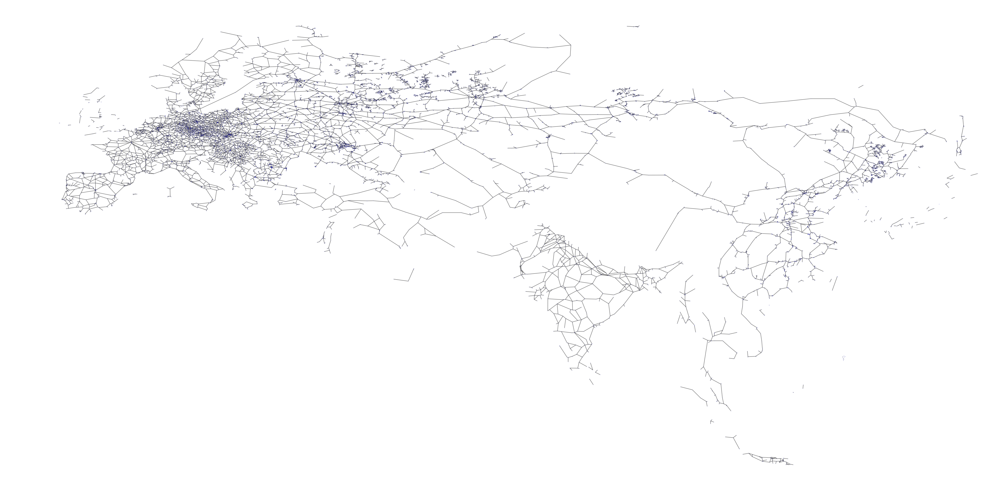

In [257]:
plot_background = False

fig, ax = plt.subplots(figsize = (40,20),dpi = 150)

# Visualise
#plt.figure(1,figsize = (40,20),dpi = 200)
nx.draw_networkx_nodes(new_graph,positions,node_size=0.2,node_color='b',alpha = 0.1,ax=ax)
nx.draw_networkx_edges(new_graph,positions,ax=ax,edge_size = 0.1,alpha = 0.5)

plot_name = "full_network.png"

# set correct extent based on already project network
left, right = plt.xlim()
y_bottom,y_top = plt.ylim()
print(left,right)
print(y_bottom,y_top)

# hard code it to given axis
ax.set_xlim(left,right-40)
ax.set_ylim(y_bottom,y_top)
plt.axis('off')

if plot_background:

    # then plot world map
    gdf_countries.plot(
    column='ADM0_A3', categorical=True, cmap='Spectral', linewidth=0, edgecolor='0.2',ax=ax,alpha = 0.1)

    plot_name = "full_network_map_back.png"
    
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

**Plot edge count distribution**

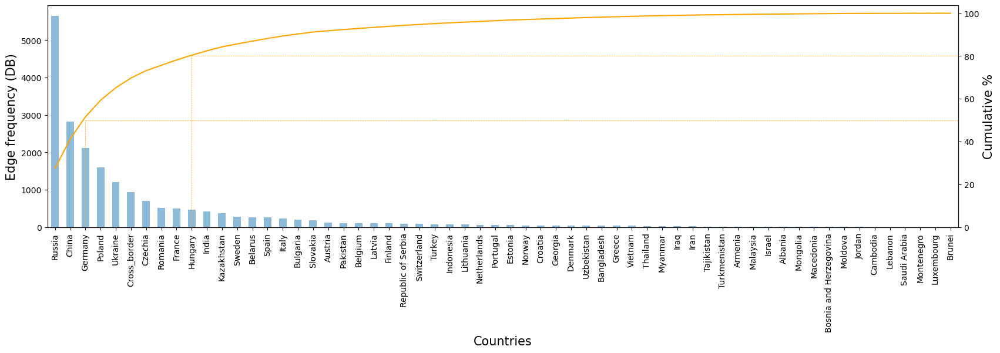

In [330]:
fig,ax = plt.subplots(figsize = (20,5), dpi = 100)
gdf_shp_load['ADMIN'].value_counts().plot(kind = 'bar',ax = ax,alpha = 0.5)
ax2 = ax.twinx()
temp_data = gdf_shp_load['ADMIN'].value_counts().copy()
temp_data = temp_data.cumsum() / temp_data.sum() * 100
temp_data.plot(kind= "line", c = "orange", ax = ax2)

ax2.set_ylim(0)

ax2.vlines(9,0,80,colors = "orange",linestyles = "dashed",linewidth = 0.5)
ax2.hlines(80,9,100,colors = "orange",linestyles = "dashed",linewidth = 0.5)

ax2.vlines(2,0,50,colors = "orange",linestyles = "dashed",linewidth = 0.5)
ax2.hlines(50,2,100,colors = "orange",linestyles = "dashed",linewidth = 0.5)



ax.set_xlabel("Countries",fontsize = 15)
ax.set_ylabel("Edge frequency (DB)",fontsize = 15)
ax2.set_ylabel("Cumulative %",fontsize = 15)

plot_name = "rail_dataset_vis.png"    
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

**Plot length sum distribution**

In [311]:
# gds (series) with geogrpahical length
gds_dg = gdf_shp_load.groupby(by = "ADMIN", axis = 0).sum().loc[:,"length"].sort_values(ascending = False).copy()/1000

# gds (series) with adjusted geographical length
gds_dgl = gdf_shp_load.groupby(by = "ADMIN", axis = 0).sum().loc[:,"length_lpi"].sort_values(ascending = False).copy()/1000

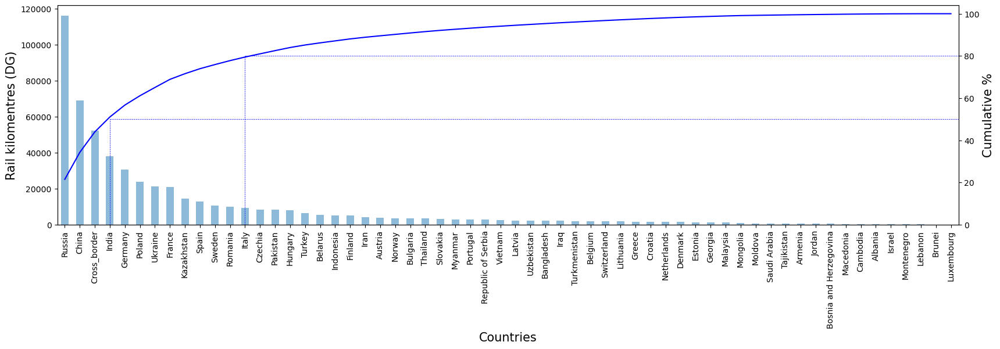

In [331]:
fig,ax = plt.subplots(figsize = (20,5), dpi = 100)
gds_dg.plot(kind = 'bar',ax = ax,alpha = 0.5)
ax2 = ax.twinx()
temp_data = gds_dg.copy()
temp_data = temp_data.cumsum() / temp_data.sum() * 100
temp_data.plot(kind= "line", c = "blue", ax = ax2)

ax2.set_ylim(0)

ax2.vlines(12,0,80,colors = "blue",linestyles = "dashed",linewidth = 0.5)
ax2.hlines(80,12,100,colors = "blue",linestyles = "dashed",linewidth = 0.5)

ax2.vlines(3,0,50,colors = "blue",linestyles = "dashed",linewidth = 0.5)
ax2.hlines(50,3,100,colors = "blue",linestyles = "dashed",linewidth = 0.5)



ax.set_xlabel("Countries",fontsize = 15)
ax.set_ylabel("Rail kilomentres (DG)",fontsize = 15)
ax2.set_ylabel("Cumulative %",fontsize = 15)

plot_name = "rail_dataset_length_vis.png"    
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

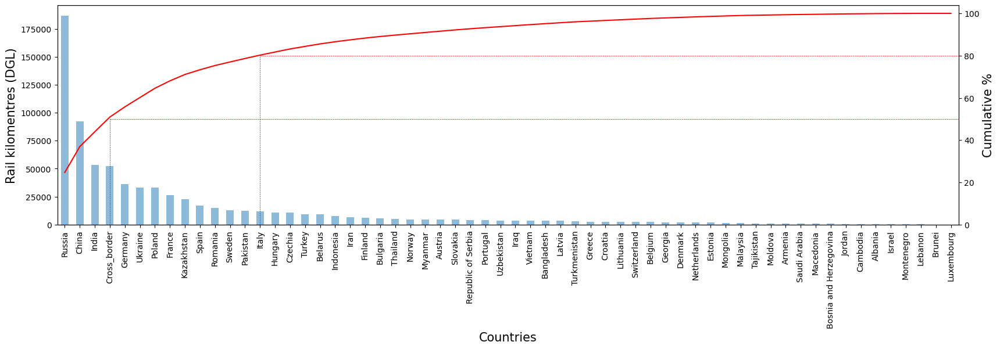

In [332]:
fig,ax = plt.subplots(figsize = (20,5), dpi = 100)
gds_dgl.plot(kind = 'bar',ax = ax,alpha = 0.5)
ax2 = ax.twinx()
temp_data = gds_dgl.copy()
temp_data = temp_data.cumsum() / temp_data.sum() * 100
temp_data.plot(kind= "line", c = "red", ax = ax2)

ax2.set_ylim(0)

ax2.vlines(13,0,80,colors = "red",linestyles = "dashed",linewidth = 0.5)
ax2.hlines(80,13,100,colors = "red",linestyles = "dashed",linewidth = 0.5)

ax2.vlines(3,0,50,colors = "red",linestyles = "dashed",linewidth = 0.5)
ax2.hlines(50,3,100,colors = "red",linestyles = "dashed",linewidth = 0.5)



ax.set_xlabel("Countries",fontsize = 15)
ax.set_ylabel("Rail kilomentres (DGL)",fontsize = 15)
ax2.set_ylabel("Cumulative %",fontsize = 15)

plot_name = "rail_dataset_length_lpi_vis.png"    
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

In [262]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
gdf_shp_load.describe()

,rwdb_rr_id,length,LPI_adjust,length_lpi
count,20528.000,20528.000,20528.000,20528.000
mean,10873.943,26312.026,1.420,36758.717
std,6500.207,40798.851,0.174,57187.346
min,0.000,0.066,1.000,0.107
25%,5227.750,5183.545,1.331,7509.556
50%,10743.500,12146.358,1.394,17307.572
75%,16158.250,28979.458,1.607,40452.573
max,23686.000,1038288.946,1.734,1385829.175


<a id="ID_part3"></a>
### Part 4 | Analysis
|| [0|Top](#ID_top) || [1|Part1](#ID_part1) || [2|Part2](#ID_part2) || [3|Part3](#ID_part3) || [4|Part4](#ID_part4) || [5|Part5](#ID_part5) ||

**Analysis 1 | centrality**

In [37]:
centrality = nx.algorithms.centrality.degree_centrality(new_graph)

In [38]:
import collections

In [346]:
outdeg = new_graph.degree()
to_highlight = [n[0] for n in outdeg if outdeg[n[0]] >= 5]
centrality_4_degrees = [n[0] for n in outdeg if (outdeg[n[0]] >= 4) & (outdeg[n[0]] < 5)]
normal = [n[0] for n in outdeg if outdeg[n[0]] < 5]

In [40]:
print(to_highlight)

[162, 1439, 1515, 1634, 3255, 4452, 4557, 4638, 4704, 5224, 5319, 5470, 6073, 9412, 9473, 10802, 10905, 10995, 11061, 12959, 14887]


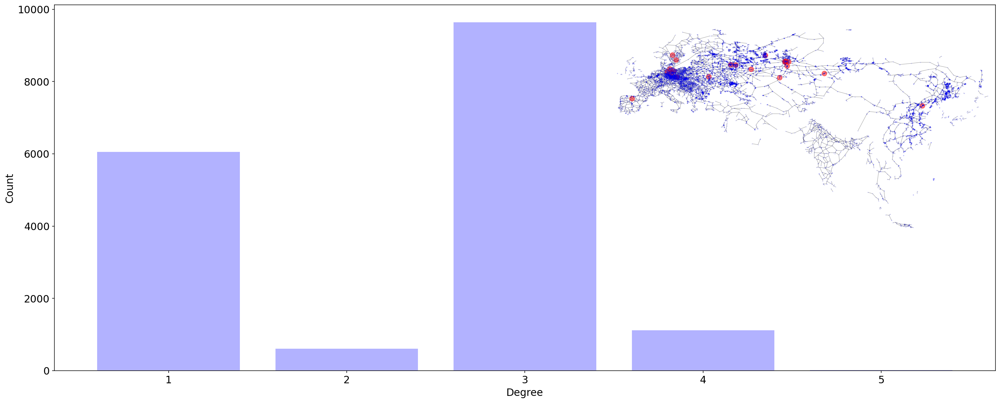

In [345]:
degree_sequence = sorted([d for n, d in new_graph.degree()], reverse=True)  # degree sequence
# print "Degree sequence", degree_sequence
degreeCount = collections.Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())

fig, ax = plt.subplots(figsize = (25,10),dpi = 150)
plt.bar(deg, cnt, width=0.80, color='b',alpha = 0.3)

#plt.title("Degree Histogram")
plt.ylabel("Count",fontsize = 15)
plt.xlabel("Degree", fontsize = 15)
ax.set_xticks([d + 0 for d in deg])
ax.set_xticklabels(deg,fontsize = 15)
ax.tick_params(axis='y', labelsize= 15) 

# draw graph in inset # . , . , width , height
ax2 = plt.axes([0.57, 0.4, 0.33, 0.45])
Gcc = new_graph.subgraph(sorted(nx.connected_components(new_graph), key=len, reverse=True)[0])

plt.axis('off')
nx.draw_networkx_nodes(to_highlight, positions, node_size=50,node_color = "red",alpha = 0.5,dpi=150)

#nx.draw_networkx_labels(to_highlight, pos, labels= to_highlight )
nx.draw_networkx_nodes(normal, positions, node_size=0.5,node_color = "blue",alpha = 0.1,dpi=150)
nx.draw_networkx_edges(new_graph, positions, alpha=0.4,dpi=150,width = 0.5)

# hard code it to given axis
ax2.set_xlim(left,right-40)
ax2.set_ylim(y_bottom,y_top)

plot_name = "route_degree_hist.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

In [348]:
# find nodes in dataframe
list_of_indeces = []

for entry in to_highlight:
    try:
        list_of_indeces.append(list(gdf_shp_load[gdf_shp_load.node_1_id == entry].index)[0])
    except:
        list_of_indeces.append(list(gdf_shp_load[gdf_shp_load.node_2_id == entry].index)[0])
        
# filter dataframe
gdf_shp_load.iloc[list_of_indeces,:].ADMIN.value_counts().to_frame().transpose()

,Russia,Germany,Kazakhstan,Sweden,Czechia,Spain,Ukraine,China
ADMIN,9,4,2,2,1,1,1,1


In [355]:
trouble_nodes

[1713, 12540, 12574]

In [356]:
# find nodes in dataframe
list_of_indeces = []
trouble_nodes = []
for entry in centrality_4_degrees:
    try:
        list_of_indeces.append(list(gdf_shp_load[gdf_shp_load.node_1_id == entry].index)[0])
    except:
        try:
            list_of_indeces.append(list(gdf_shp_load[gdf_shp_load.node_2_id == entry].index)[0])
        except:
            trouble_nodes.append(entry)
            
# filter dataframe
gdf_shp_load.iloc[list_of_indeces,:].ADMIN.value_counts().to_frame().head(15)

,ADMIN
Russia,272
Poland,142
Germany,133
China,106
Ukraine,92
Hungary,41
Czechia,39
India,28
Belarus,27
Romania,25


In [357]:
gdf_shp_load.iloc[list_of_indeces,:].ADMIN.value_counts().to_frame().sum()

ADMIN    1116
dtype: int64

**Analysis 2 | Betweeness centrality**

In [ ]:
# Dummy single test run

# betweeness
time_start = time.time()
#betweeness_centrality = nx.algorithms.centrality.betweenness_centrality(new_graph)
time_end = time.time()
duration = time_end - time_start
print(f"This task took: {duration/60}")

In [44]:
# Assign new names to list
list_of_distances = ["db","dg","dgl"]

# for every distance measure run the test
df_betweeness = pd.DataFrame(index = np.arange(0,len(new_graph)))

for distance in list_of_distances:
    time_start = time.time()
    print(f"Working on distance: {distance}")
    betweeness_centrality = nx.algorithms.centrality.betweenness_centrality(new_graph,weight = distance)
    temp_df = pd.DataFrame.from_dict(betweeness_centrality,orient = "index",columns=[distance]).reset_index()
    temp_df.columns = [f"Country ({distance})",distance]
    temp_df = temp_df.sort_values(by = distance, ascending = False).reset_index(drop = True).copy()
    
    df_betweeness = df_betweeness.merge(temp_df,how="left",left_index = True,right_index = True).copy()
    time_end = time.time()
    duration = time_end - time_start
    print(f"\tThis task took: {duration/60}")

Working on distance: db
	This task took: 33.173089468479155
Working on distance: dg
	This task took: 38.4303031484286
Working on distance: dgl
	This task took: 57.31191798845927


In [46]:
betweenness_name = "route_between_b"

s_file_export.f_df_export(df_betweeness,betweenness_name,p_file_id = f"{notebook_id}_",p_loc2 = path_analysis,
                          p_loc2_pre = "analysis_"
                         )

Export | ../Data/1_raw_processed_backup/220b_store_route_between_b_20200823_1054.csv | COMPLETE
COPY   | ../Data/3_analysis/220b_analysis_route_between_b.csv.gzip | COMPLETE


In [400]:
df_betweeness

,Country (db),db,Country (dg),dg,Country (dgl),dgl
0,6769,0.279,5221,0.218,5221,0.241
1,6803,0.279,5224,0.217,5224,0.239
2,6622,0.279,5359,0.208,5359,0.234
3,6665,0.274,5358,0.208,5358,0.234
4,6659,0.272,5375,0.208,5375,0.234
...,...,...,...,...,...,...
17444,7078,0.000,7090,0.000,7090,0.000
17445,7077,0.000,7088,0.000,7088,0.000
17446,7074,0.000,7086,0.000,7086,0.000
17447,7073,0.000,7084,0.000,7084,0.000


In [45]:
df_betweeness.describe()

,Country (db),db,Country (dg),dg,Country (dgl),dgl
count,17449.000000,17449.000000,17449.000000,17449.000000,17449.000000,17449.000000
mean,8724.000000,0.004379,8724.000000,0.006214,8724.000000,0.006112
std,5037.236759,0.018717,5037.236759,0.019401,5037.236759,0.020225
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4362.000000,0.000000,4362.000000,0.000000,4362.000000,0.000000
50%,8724.000000,0.000207,8724.000000,0.000234,8724.000000,0.000231
75%,13086.000000,0.001539,13086.000000,0.002941,13086.000000,0.002955
max,17448.000000,0.278844,17448.000000,0.218009,17448.000000,0.240504


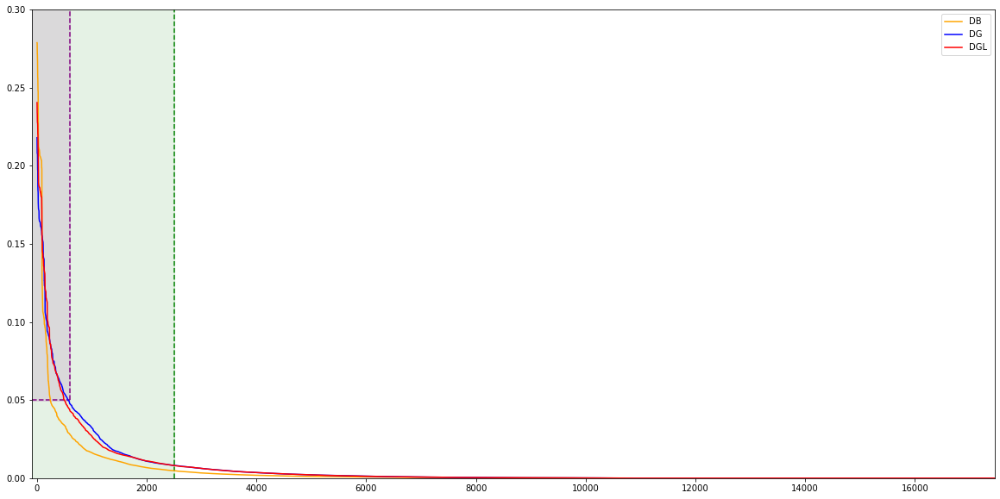

In [55]:
# total graph
fig,ax = plt.subplots()
plt.xlim(-100,len(df_betweeness))
plt.ylim(0,0.3)
ax.axvspan(-100,2500,0,1,color = "g", alpha = 0.1)
ax.axvspan(-100,600,0.165,1,color = "purple", alpha = 0.1)
df_betweeness.loc[:,"db"].plot(figsize = (20,10), ax = ax, label = "DB",color = "orange")
df_betweeness.loc[:,"dg"].plot(figsize = (20,10), ax = ax, label = "DG",color = "blue")
df_betweeness.loc[:,"dgl"].plot(figsize = (20,10), ax = ax, label = "DGL", color = "red")
ax.hlines(0.05,-100,600,colors = "purple",linestyles = "dashed")
ax.vlines(600,0.05,0.3,colors = "purple",linestyles = "dashed")
ax.vlines(2500,0,0.3,colors = "g",linestyles = "dashed")

plt.legend()
plot_name = "betweeness_whole.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")

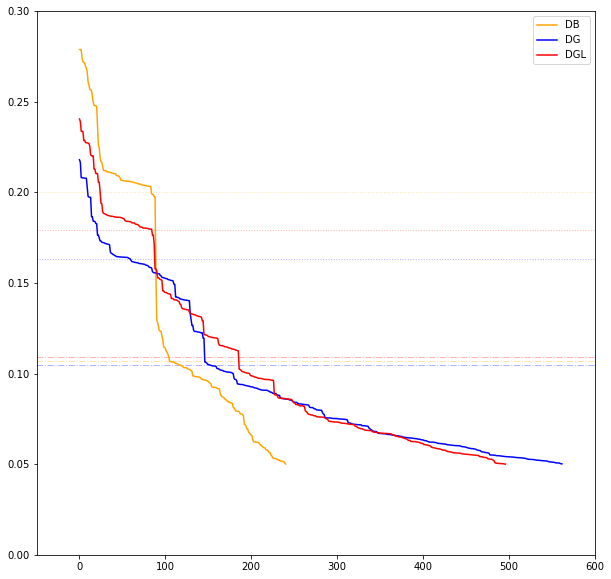

In [67]:
# cut off by y axis
df_betweeness[df_betweeness.loc[:,"db"] > 0.05].loc[:,"db"].plot(figsize = (10,10), label = "DB",color = "orange")
df_betweeness[df_betweeness.loc[:,"dg"] > 0.05].loc[:,"dg"].plot(figsize = (10,10), label = "DG",color = "blue")
df_betweeness[df_betweeness.loc[:,"dgl"] > 0.05].loc[:,"dgl"].plot(figsize = (10,10), label = "DGL",color = "red")
plt.ylim(0,0.3)

# reference lines category 1
plt.xlim(-50,600)
plt.hlines(0.2,-100,600,colors = "orange",linestyles = ":",alpha = 0.3,linewidth = 1)
plt.hlines(0.163,-100,600,colors = "blue",linestyles = ":",alpha = 0.3,linewidth = 1)
plt.hlines(0.179,-100,600,colors = "red",linestyles = ":",alpha = 0.3,linewidth = 1)

# reference lines category 2
plt.hlines(0.107,-100,600,colors = "orange",linestyles = "-.",alpha = 0.3,linewidth = 1)
plt.hlines(0.105,-100,600,colors = "blue",linestyles = "-.",alpha = 0.3,linewidth = 1)
plt.hlines(0.109,-100,600,colors = "red",linestyles = "-.",alpha = 0.3,linewidth = 1)

plt.legend()
plot_name = "betweeness_red.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")

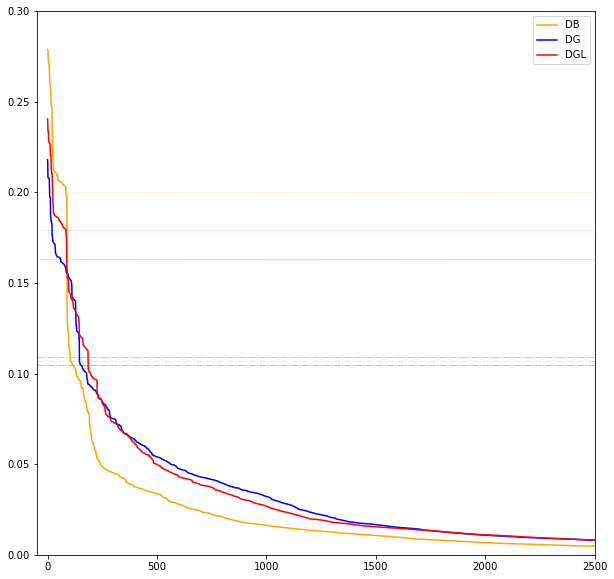

In [93]:
# cut off by y axis
df_betweeness.iloc[0:2500,:].loc[:,"db"].plot(figsize = (10,10), label = "DB",color = "orange")
df_betweeness.iloc[0:2500,:].loc[:,"dg"].plot(figsize = (10,10), label = "DG",color = "blue")
df_betweeness.iloc[0:2500,:].loc[:,"dgl"].plot(figsize = (10,10), label = "DGL",color = "red")
plt.legend()
plt.ylim(0,0.3)

# reference lines
plt.xlim(-50,2500)
plt.hlines(0.2,-100,2500,colors = "orange",linestyles = ":",alpha = 0.3,linewidth = 1)
plt.hlines(0.163,-100,2500,colors = "blue",linestyles = ":",alpha = 0.3,linewidth = 1)
plt.hlines(0.179,-100,2500,colors = "red",linestyles = ":",alpha = 0.3,linewidth = 1)

# reference lines category 2
plt.hlines(0.107,-100,2500,colors = "orange",linestyles = "-.",alpha = 0.3,linewidth = 1)
plt.hlines(0.105,-100,2500,colors = "blue",linestyles = "-.",alpha = 0.3,linewidth = 1)
plt.hlines(0.109,-100,2500,colors = "red",linestyles = "-.",alpha = 0.3,linewidth = 1)


# save image
plot_name = "betweeness_green.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")

**Summarise by country**

In [435]:
# DB
upper_limit = 500
selected_nodes = list(df_betweeness.head(upper_limit).loc[:,"Country (db)"])


# find nodes
all_node1 = set(gdf_shp_load.node_1_id.unique())
all_node2 = set(selected_nodes) - all_node1
all_node1 = set(selected_nodes) - all_node2

# create temp dataframe
temp_df = gdf_shp_load.set_index("node_1_id",drop = False).copy()
temp_df_2 = gdf_shp_load.set_index("node_2_id",drop = False).copy()

temp_df_filter = temp_df.loc[list(all_node1),:].sort_values(by = "LPI_adjust", ascending = False)
temp_df_filter_2 = temp_df_2.loc[list(all_node2),:].sort_values(by = "LPI_adjust", ascending = False)

temp_df_stacked = pd.concat([temp_df_filter,temp_df_filter_2])

temp_df_stacked.sort_values(by = "LPI_adjust", ascending = False).reset_index().drop_duplicates(subset=["index"]).ADMIN.value_counts()

Russia          197
China            85
Poland           50
Kazakhstan       28
Ukraine          26
Sweden           19
Belarus          19
Slovakia         18
Cross_border     18
Austria          15
Finland          10
Norway            5
Switzerland       5
France            2
Moldova           1
Latvia            1
Lithuania         1
Name: ADMIN, dtype: int64

In [434]:
# DG
upper_limit = 500
selected_nodes = list(df_betweeness.head(upper_limit).loc[:,"Country (dg)"])

# find nodes
all_node1 = set(gdf_shp_load.node_1_id.unique())
all_node2 = set(selected_nodes) - all_node1
all_node1 = set(selected_nodes) - all_node2

# create temp dataframe
temp_df = gdf_shp_load.set_index("node_1_id",drop = False).copy()
temp_df_2 = gdf_shp_load.set_index("node_2_id",drop = False).copy()

temp_df_filter = temp_df.loc[list(all_node1),:].sort_values(by = "LPI_adjust", ascending = False)
temp_df_filter_2 = temp_df_2.loc[list(all_node2),:].sort_values(by = "LPI_adjust", ascending = False)

temp_df_stacked = pd.concat([temp_df_filter,temp_df_filter_2])

temp_df_stacked.sort_values(by = "LPI_adjust", ascending = False).reset_index().drop_duplicates(subset=["index"]).ADMIN.value_counts()

Russia          263
Poland           80
China            57
Kazakhstan       37
Belarus          19
Germany          19
Lithuania         9
Cross_border      6
Ukraine           6
Latvia            4
Name: ADMIN, dtype: int64

In [433]:
# DGL
upper_limit = 500
selected_nodes = list(df_betweeness.head(upper_limit).loc[:,"Country (dgl)"])

# find nodes
all_node1 = set(gdf_shp_load.node_1_id.unique())
all_node2 = set(selected_nodes) - all_node1
all_node1 = set(selected_nodes) - all_node2

# create temp dataframe
temp_df = gdf_shp_load.set_index("node_1_id",drop = False).copy()
temp_df_2 = gdf_shp_load.set_index("node_2_id",drop = False).copy()

temp_df_filter = temp_df.loc[list(all_node1),:].sort_values(by = "LPI_adjust", ascending = False)
temp_df_filter_2 = temp_df_2.loc[list(all_node2),:].sort_values(by = "LPI_adjust", ascending = False)

temp_df_stacked = pd.concat([temp_df_filter,temp_df_filter_2])

temp_df_stacked.sort_values(by = "LPI_adjust", ascending = False).reset_index().drop_duplicates(subset=["index"]).ADMIN.value_counts()

Russia          230
Poland          107
China            58
Germany          37
Ukraine          19
Cross_border     13
Lithuania        12
Belarus          10
Kazakhstan       10
Latvia            4
Name: ADMIN, dtype: int64

In [84]:
df_betweeness.head()

,Country (db),db,Country (dg),dg,Country (dgl),dgl
0,6769,0.278844,5221,0.218009,5221,0.240504
1,6803,0.278801,5224,0.216589,5224,0.239078
2,6622,0.278685,5359,0.208158,5359,0.233738
3,6665,0.273912,5358,0.208127,5358,0.233708
4,6659,0.272310,5375,0.207994,5375,0.233589


**Visualise as network**

In [86]:
# identify nodes to highlight
def f_b_c_node_highlight(p_betweeness_df,p_col_node_index,p_col_meausre_index,p_count_cut_off = None,p_value_cut_off_min = None,p_value_cut_off_max = None,p_return_df = False):
    """Only request one kind of return, otherwise you will only get the one based on values as it executes second."""
    
    
    node_list = []
    f_df = p_betweeness_df.copy()
    
    if p_count_cut_off is None:
        #print("Count none")
        pass
    else:
        temp_df = f_df.iloc[:p_count_cut_off,p_col_node_index]
        node_list = list(temp_df)
        
    if p_value_cut_off_min is None:
        #print("Value none")
        pass
    else:
        temp_df = f_df[(f_df.iloc[:,p_col_meausre_index] < p_value_cut_off_max) & 
             (f_df.iloc[:,p_col_meausre_index] >= p_value_cut_off_min)].iloc[:,p_col_node_index]
        node_list = list(temp_df)
    
    # choose what to return
    if p_return_df:
        # true
        return_object = temp_df
        
    else:
        return_object = node_list
    
    
    return return_object

Create lists of nodes for geo distnace (orange) and edge distance (blue)

In [94]:
# Calculate categories for Distance Baseline (Edge based)
db_list_cat_1 = f_b_c_node_highlight(df_betweeness,0,p_col_meausre_index =1,
                                      p_value_cut_off_min = 0.2,p_value_cut_off_max = 0.3)
db_list_cat_2 = f_b_c_node_highlight(df_betweeness,0,p_col_meausre_index =1,
                                      p_value_cut_off_min = 0.107,p_value_cut_off_max = 0.2)
db_list_cat_3 = f_b_c_node_highlight(df_betweeness,0,p_col_meausre_index =1,
                                      p_value_cut_off_min = 0.05,p_value_cut_off_max = 0.107)

# Calculate categories for Distance Geographical (DG)
dg_list_cat_1 = f_b_c_node_highlight(df_betweeness,2,p_col_meausre_index =3,
                                      p_value_cut_off_min = 0.163,p_value_cut_off_max = 0.3)
dg_list_cat_2 = f_b_c_node_highlight(df_betweeness,2,p_col_meausre_index =3,
                                      p_value_cut_off_min = 0.105,p_value_cut_off_max = 0.163)
dg_list_cat_3 = f_b_c_node_highlight(df_betweeness,2,p_col_meausre_index =3,
                                      p_value_cut_off_min = 0.05,p_value_cut_off_max = 0.105)

# Calculate categories for Distance Geographical (DGL)
dgl_list_cat_1 = f_b_c_node_highlight(df_betweeness,4,p_col_meausre_index =5,
                                      p_value_cut_off_min = 0.179,p_value_cut_off_max = 0.3)
dgl_list_cat_2 = f_b_c_node_highlight(df_betweeness,4,p_col_meausre_index =5,
                                      p_value_cut_off_min = 0.109,p_value_cut_off_max = 0.179)
dgl_list_cat_3 = f_b_c_node_highlight(df_betweeness,4,p_col_meausre_index =5,
                                      p_value_cut_off_min = 0.05,p_value_cut_off_max = 0.109)

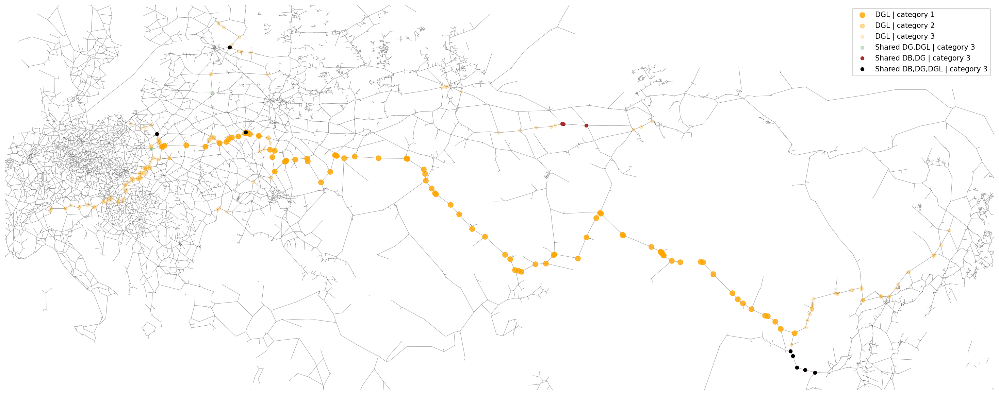

In [129]:
# visualise

fig, ax = plt.subplots(figsize = (25,10),dpi = 150)

ax.tick_params(axis='y', labelsize= 15) 

plt.axis('off')

alt_b_cat_1 = set(dg_list_cat_1)
alt_b_cat_2 = set(dg_list_cat_2)
alt_b_cat_3 = set(dg_list_cat_3)

base_cat_1 = set(db_list_cat_1)
base_cat_2 = set(db_list_cat_2)
base_cat_3 = set(db_list_cat_3)

alt_a_cat_1 = set(dgl_list_cat_1)
alt_a_cat_2 = set(dgl_list_cat_2)
alt_a_cat_3 = set(dgl_list_cat_3)

# nodes to highlight
temp_colour = "orange"
nx.draw_networkx_nodes(base_cat_1-alt_a_cat_1-alt_b_cat_1, positions, node_size=50,node_color = temp_colour,alpha = 0.8,dpi=150, label = "DGL | category 1")
nx.draw_networkx_nodes(base_cat_2-alt_a_cat_2-alt_b_cat_2, positions, node_size=35,node_color = temp_colour,alpha = 0.4,dpi=150, label = "DGL | category 2")
nx.draw_networkx_nodes(base_cat_3-alt_a_cat_3-alt_b_cat_3, positions, node_size=20,node_color = temp_colour,alpha = 0.2,dpi=150, label = "DGL | category 3")

# base + B (orange/yellow+blue = green)
temp_colour = "green"
nx.draw_networkx_nodes(base_cat_1&alt_b_cat_1, positions, node_size=50,node_color = temp_colour,alpha = 0.8,dpi=150, label = "Shared DG,DGL | category 1")
nx.draw_networkx_nodes(base_cat_2&alt_b_cat_2, positions, node_size=35,node_color = temp_colour,alpha = 0.3,dpi=150, label = "Shared DG,DGL | category 2")
nx.draw_networkx_nodes(base_cat_3&alt_b_cat_3, positions, node_size=20,node_color = temp_colour,alpha = 0.2,dpi=150, label = "Shared DG,DGL | category 3")

# base + A (orange/yellow + red = brown)
temp_colour = "brown"
nx.draw_networkx_nodes(base_cat_1&alt_a_cat_1, positions, node_size=50,node_color = temp_colour,alpha = 0.8,dpi=150, label = "Shared DB,DG | category 1")
nx.draw_networkx_nodes(base_cat_2&alt_a_cat_2, positions, node_size=35,node_color = temp_colour,alpha = 0.4,dpi=150, label = "Shared DB,DG | category 2")
nx.draw_networkx_nodes(base_cat_3&alt_a_cat_3, positions, node_size=20,node_color = temp_colour,alpha = 1,dpi=150, label = "Shared DB,DG | category 3")

# base + A + B (orange/yellow + red + blue = black)
nx.draw_networkx_nodes(base_cat_1&alt_a_cat_1&alt_b_cat_1, positions, node_size=50,node_color = "black",alpha = 0.8,dpi=150, label = "Shared DB,DG,DGL | category 1")
nx.draw_networkx_nodes(base_cat_2&alt_a_cat_2&alt_b_cat_2, positions, node_size=35,node_color = "black",alpha = 0.4,dpi=150, label = "Shared DB,DG,DGL | category 2")
nx.draw_networkx_nodes(base_cat_3&alt_a_cat_3&alt_b_cat_3, positions, node_size=20,node_color = "black",alpha = 1,dpi=150, label = "Shared DB,DG,DGL | category 3")

plt.legend()

# draw all edges
nx.draw_networkx_edges(new_graph, positions, alpha=0.4,dpi=150,width = 0.5)

# draw custom edge paths
#nx.draw_networkx_edges(new_graph, positions, 
 #                      dpi=150,width = 5,alpha = 0.4, ax=ax, edge_color = "black")

plot_name = "betweeness_db_orange.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

**Visualise geographical distance nodes**

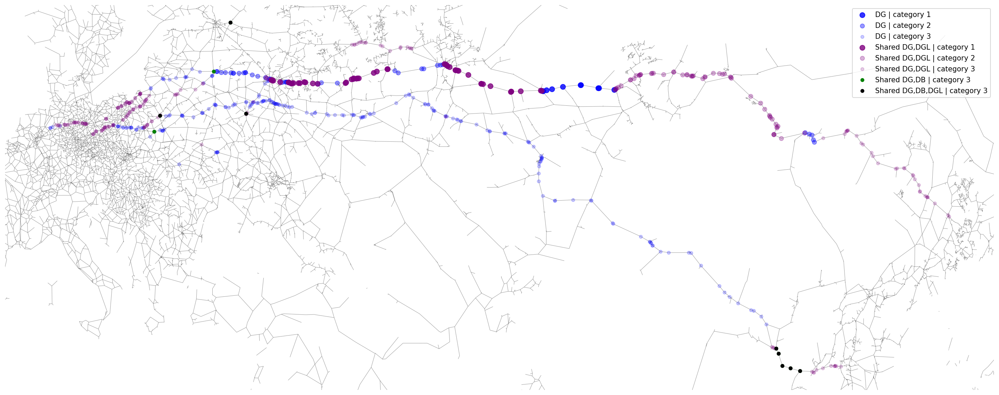

In [130]:
# visualise

fig, ax = plt.subplots(figsize = (25,10),dpi = 150)

ax.tick_params(axis='y', labelsize= 15) 

plt.axis('off')

# nodes to highlight
nx.draw_networkx_nodes(set(dg_list_cat_1)-set(db_list_cat_1)-set(dgl_list_cat_1), positions, node_size=50,node_color = "blue",alpha = 0.8,dpi=150, label = "DG | category 1")
nx.draw_networkx_nodes(set(dg_list_cat_2)-set(db_list_cat_2)-set(dgl_list_cat_2), positions, node_size=35,node_color = "blue",alpha = 0.4,dpi=150, label = "DG | category 2")
nx.draw_networkx_nodes(set(dg_list_cat_3)-set(db_list_cat_3)-set(dgl_list_cat_3), positions, node_size=20,node_color = "blue",alpha = 0.2,dpi=150, label = "DG | category 3")

nx.draw_networkx_nodes(set(dg_list_cat_1)&set(dgl_list_cat_1), positions, node_size=50,node_color = "purple",alpha = 0.8,dpi=150, label = "Shared DG,DGL | category 1")
nx.draw_networkx_nodes(set(dg_list_cat_2)&set(dgl_list_cat_2), positions, node_size=35,node_color = "purple",alpha = 0.3,dpi=150, label = "Shared DG,DGL | category 2")
nx.draw_networkx_nodes(set(dg_list_cat_3)&set(dgl_list_cat_3), positions, node_size=20,node_color = "purple",alpha = 0.2,dpi=150, label = "Shared DG,DGL | category 3")

nx.draw_networkx_nodes(set(dg_list_cat_1)&set(db_list_cat_1), positions, node_size=50,node_color = "green",alpha = 0.8,dpi=150, label = "Shared DG,DB | category 1")
nx.draw_networkx_nodes(set(dg_list_cat_2)&set(db_list_cat_2), positions, node_size=35,node_color = "green",alpha = 0.4,dpi=150, label = "Shared DG,DB | category 2")
nx.draw_networkx_nodes(set(dg_list_cat_3)&set(db_list_cat_3), positions, node_size=20,node_color = "green",alpha = 1,dpi=150, label = "Shared DG,DB | category 3")

nx.draw_networkx_nodes(set(dg_list_cat_1)&set(db_list_cat_1)&set(dgl_list_cat_1), positions, node_size=50,node_color = "black",alpha = 0.8,dpi=150, label = "Shared DG,DB,DGL | category 1")
nx.draw_networkx_nodes(set(dg_list_cat_2)&set(db_list_cat_2)&set(dgl_list_cat_2), positions, node_size=35,node_color = "black",alpha = 0.4,dpi=150, label = "Shared DG,DB,DGL | category 2")
nx.draw_networkx_nodes(set(dg_list_cat_3)&set(db_list_cat_3)&set(dgl_list_cat_3), positions, node_size=20,node_color = "black",alpha = 1,dpi=150, label = "Shared DG,DB,DGL | category 3")

plt.legend()

# draw all edges
nx.draw_networkx_edges(new_graph, positions, alpha=0.4,dpi=150,width = 0.5)

# draw custom edge paths
#nx.draw_networkx_edges(new_graph, positions, 
 #                      dpi=150,width = 5,alpha = 0.4, ax=ax, edge_color = "black")

plot_name = "betweeness_dg_blue.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

**Visualise logistic adjusted geo distance**

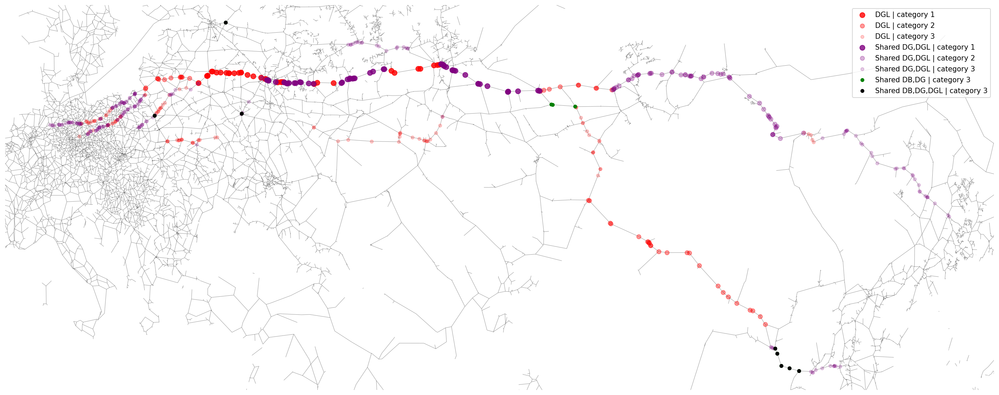

In [131]:
# visualise

fig, ax = plt.subplots(figsize = (25,10),dpi = 150)

ax.tick_params(axis='y', labelsize= 15) 

plt.axis('off')

alt_b_cat_1 = set(dg_list_cat_1)
alt_b_cat_2 = set(dg_list_cat_2)
alt_b_cat_3 = set(dg_list_cat_3)

alt_a_cat_1 = set(db_list_cat_1)
alt_a_cat_2 = set(db_list_cat_2)
alt_a_cat_3 = set(db_list_cat_3)

base_cat_1 = set(dgl_list_cat_1)
base_cat_2 = set(dgl_list_cat_2)
base_cat_3 = set(dgl_list_cat_3)

# nodes to highlight
nx.draw_networkx_nodes(base_cat_1-alt_a_cat_1-alt_b_cat_1, positions, node_size=50,node_color = "red",alpha = 0.8,dpi=150, label = "DGL | category 1")
nx.draw_networkx_nodes(base_cat_2-alt_a_cat_2-alt_b_cat_2, positions, node_size=35,node_color = "red",alpha = 0.4,dpi=150, label = "DGL | category 2")
nx.draw_networkx_nodes(base_cat_3-alt_a_cat_3-alt_b_cat_3, positions, node_size=20,node_color = "red",alpha = 0.2,dpi=150, label = "DGL | category 3")

# base + B (red+blue = purple)
temp_colour = "purple"
nx.draw_networkx_nodes(base_cat_1&alt_b_cat_1, positions, node_size=50,node_color = temp_colour,alpha = 0.8,dpi=150, label = "Shared DG,DGL | category 1")
nx.draw_networkx_nodes(base_cat_2&alt_b_cat_2, positions, node_size=35,node_color = temp_colour,alpha = 0.3,dpi=150, label = "Shared DG,DGL | category 2")
nx.draw_networkx_nodes(base_cat_3&alt_b_cat_3, positions, node_size=20,node_color = temp_colour,alpha = 0.2,dpi=150, label = "Shared DG,DGL | category 3")

# base + A (red + yellow = green)
temp_colour = "green"
nx.draw_networkx_nodes(base_cat_1&alt_a_cat_1, positions, node_size=50,node_color = temp_colour,alpha = 0.8,dpi=150, label = "Shared DB,DG | category 1")
nx.draw_networkx_nodes(base_cat_2&alt_a_cat_2, positions, node_size=35,node_color = temp_colour,alpha = 0.4,dpi=150, label = "Shared DB,DG | category 2")
nx.draw_networkx_nodes(base_cat_3&alt_a_cat_3, positions, node_size=20,node_color = temp_colour,alpha = 1,dpi=150, label = "Shared DB,DG | category 3")

nx.draw_networkx_nodes(base_cat_1&alt_a_cat_1&alt_b_cat_1, positions, node_size=50,node_color = "black",alpha = 0.8,dpi=150, label = "Shared DB,DG,DGL | category 1")
nx.draw_networkx_nodes(base_cat_2&alt_a_cat_2&alt_b_cat_2, positions, node_size=35,node_color = "black",alpha = 0.4,dpi=150, label = "Shared DB,DG,DGL | category 2")
nx.draw_networkx_nodes(base_cat_3&alt_a_cat_3&alt_b_cat_3, positions, node_size=20,node_color = "black",alpha = 1,dpi=150, label = "Shared DB,DG,DGL | category 3")

plt.legend()

# draw all edges
nx.draw_networkx_edges(new_graph, positions, alpha=0.4,dpi=150,width = 0.5)

# draw custom edge paths
#nx.draw_networkx_edges(new_graph, positions, 
 #                      dpi=150,width = 5,alpha = 0.4, ax=ax, edge_color = "black")

plot_name = "betweeness_dgl_red.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

**Visualise all measures together**

2.7861939305555534 132.6149152361111
32.890306499999994 63.25580405555555


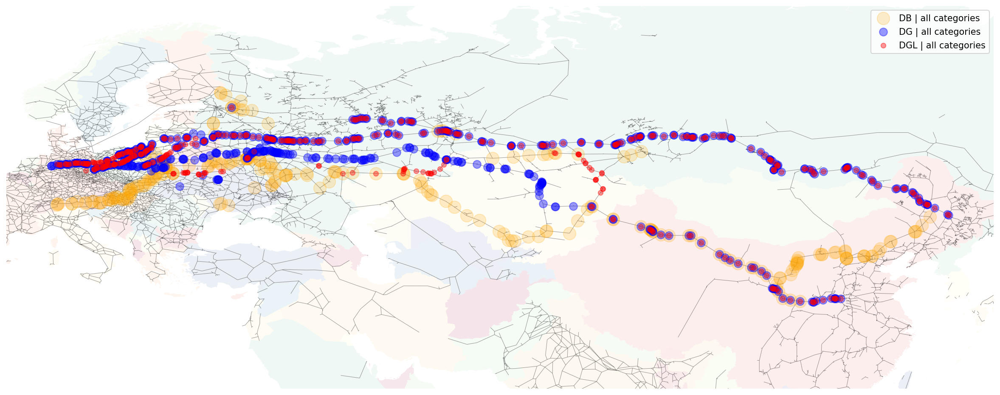

In [399]:
plot_background = True

# visualise

fig, ax = plt.subplots(figsize = (20,10),dpi = 150)

ax.tick_params(axis='y', labelsize= 15) 

plt.axis('off')

# nodes to highlight (db)
nx.draw_networkx_nodes(db_list_cat_1+db_list_cat_2+db_list_cat_3, positions, node_size=200,node_color = "orange",alpha = 0.2,dpi=150, label = "DB | all categories")
# nodes to highlight (dg)
nx.draw_networkx_nodes(dg_list_cat_1+dg_list_cat_2+dg_list_cat_3, positions, node_size=80,node_color = "blue",alpha = 0.4,dpi=150, label = "DG | all categories")
# nodes to highlight (dgl)
nx.draw_networkx_nodes(dgl_list_cat_1+dgl_list_cat_2+dgl_list_cat_3, positions, node_size=30,node_color = "red",alpha = 0.4,dpi=150, label = "DGL | all categories")

if plot_background:
    # set correct extent based on already project network
    left, right = plt.xlim()
    y_bottom,y_top = plt.ylim()
    print(left,right)
    print(y_bottom,y_top)

    # hard code it to given axis
    ax.set_xlim(left,right)
    ax.set_ylim(y_bottom-10,y_top+10)

    # then plot world map
    gdf_countries.plot(
    column='ADM0_A3', categorical=True, cmap='Spectral', linewidth=0, edgecolor='0.2',ax=ax,alpha = 0.1)


plt.legend()

# draw all edges
nx.draw_networkx_edges(new_graph, positions, alpha=0.4,dpi=150,width = 0.5)

plot_name = "betweeness_route_all.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

In [ ]:
# country summaries
df_geo_between = f_b_c_node_highlight(df_betweeness,0,p_col_meausre_index =1,
                                      p_value_cut_off_min = 0.05,p_value_cut_off_max = 0.3,p_return_df = True)

# country summaries
df_edge_between = f_b_c_node_highlight(df_betweeness,2,p_col_meausre_index =3,
                                      p_value_cut_off_min = 0.05,p_value_cut_off_max = 0.3,p_return_df = True)

In [ ]:
def f_df_node_checker(p_df_source,p_df_node_col_list,p_node_list):
    """Check source dataframe for rows that contain a node id in a given list"""
    
    p_df = p_df_source.copy()
    #p_df = p_df[p_df.ADMIN != "Cross_border"].copy()
    
    return_list = []
    
    for node in p_node_list:
        
        try:
            f_df_filter = p_df[p_df.loc[:,p_df_node_col_list[0]] == node]
            #print(node)
            return_list.append(list(f_df_filter.index)[0])
        except:
            f_df_filter = p_df[p_df.loc[:,p_df_node_col_list[1]] == node]
            return_list.append(list(f_df_filter.index)[0])
    
    return return_list

In [ ]:
# find rows based on the nodes returned by betweeness centrality analysis
geo_index_finder = f_df_node_checker(gdf_shp_load,["node_1_id","node_2_id"],list(df_geo_between))

# check same numbder of nodes
print(f"Total nodes: {len(geo_index_finder)}\nChecking difference in nodes: {len(geo_index_finder) - len(df_geo_between)} (zero wanted)")

# filter dataframe
gdf_shp_load.loc[geo_index_finder,:].ADMIN.value_counts()

In [ ]:
# find rows based on the nodes returned by betweeness centrality analysis
edge_dist_index_finder = f_df_node_checker(gdf_shp_load,["node_1_id","node_2_id"],list(df_edge_between))

print(f"Total nodes: {len(edge_dist_index_finder)}\nChecking difference in nodes: {len(edge_dist_index_finder) - len(df_edge_between)} (zero wanted)")

# filter dataframe
gdf_shp_load.loc[edge_dist_index_finder,:].ADMIN.value_counts()

### Short path test

In [134]:
# Set network node starting points
node_start = 15793 # Ningbo, China
node_end = 10858 # Hamburg,Germany

In [135]:
rail_id_start = 21634
rail_id_end = 6067

gdf_shp_load[(gdf_shp_load.node_1_id == node_start) | (gdf_shp_load.node_2_id == node_start) | 
             (gdf_shp_load.node_1_id == node_end) | (gdf_shp_load.node_2_id == node_end) | 
             (gdf_shp_load.rwdb_rr_id == rail_id_start) | (gdf_shp_load.rwdb_rr_id == rail_id_end)
            ]

,rwdb_rr_id,featurecla,continent,length,ADMIN,ADM0_A3,CONTINENT_,NAME_EN,LPI_adjust,length_lpi,geometry,node_1_position,node_2_position,edge_key,node_1_id,node_2_id,edge_id
12442,6059,Railroad,Europe,40454.131294,Germany,DEU,Europe,Germany,1.193508,48282.339446,"LINESTRING (10.00167 53.54944, 10.38917 53.80694)","(10.001666388888887, 53.54944361111111)","(10.389166388888887, 53.80694361111111)","((10.001666388888887, 53.54944361111111), (10....",10858,10829,"(10858, 10829)"
12443,6060,Railroad,Europe,34673.278400,Germany,DEU,Europe,Germany,1.193508,41382.843825,"LINESTRING (10.00167 53.54944, 9.65556 53.76055)","(10.001666388888887, 53.54944361111111)","(9.65555611111111, 53.760555)","((10.001666388888887, 53.54944361111111), (9.6...",10858,10837,"(10858, 10837)"
12447,6067,Railroad,Europe,773.432295,Germany,DEU,Europe,Germany,1.193508,923.097825,"LINESTRING (10.00722 53.54333, 10.00167 53.54944)","(10.0072225, 53.54333277777778)","(10.001666388888887, 53.54944361111111)","((10.0072225, 53.54333277777778), (10.00166638...",10861,10858,"(10861, 10858)"
18366,21630,Railroad,Asia,18196.435396,China,CHN,Asia,People's Republic of China,1.334724,24287.219038,"LINESTRING (121.52361 29.93306, 121.67200 29.9...","(121.52361194444444, 29.933055555555555)","(121.67200361111111, 29.967541388888886)","((121.52361194444444, 29.933055555555555), (12...",15793,15794,"(15793, 15794)"
18367,21631,Railroad,Asia,134473.180229,China,CHN,Asia,People's Republic of China,1.334724,179484.581009,"LINESTRING (121.52361 29.93306, 120.25556 30.1...","(121.52361194444444, 29.933055555555555)","(120.25555555555556, 30.163334166666665)","((121.52361194444444, 29.933055555555555), (12...",15793,15781,"(15793, 15781)"
18368,21634,Railroad,Asia,7150.432071,China,CHN,Asia,People's Republic of China,1.334724,9543.853296,"LINESTRING (121.52651 29.87051, 121.52361 29.9...","(121.52650638888889, 29.870511944444445)","(121.52361194444444, 29.933055555555555)","((121.52650638888889, 29.870511944444445), (12...",15795,15793,"(15795, 15793)"


In [ ]:
# check node metadata

In [136]:
list_of_distances = ["db","dg","dgl"]
list_of_paths = []
for entry in list_of_distances:
    print(f"Shortest path ({entry})| {node_start}=>{node_end} | \n\t{nx.nx.single_source_dijkstra(new_graph,node_start,node_end,weight =entry)}")
    temp_route = nx.nx.single_source_dijkstra(new_graph,node_start,node_end,weight =entry)[1]
    list_of_paths.append(temp_route)

Shortest path (db)| 15793=>10858 | 
	(202, [15793, 15781, 15777, 15740, 15730, 15744, 15824, 15833, 15864, 15874, 15873, 15860, 15845, 15798, 15787, 15779, 15774, 15772, 15759, 15757, 15758, 15756, 15755, 15751, 15691, 15695, 15648, 15634, 15628, 15627, 15623, 15595, 15576, 15575, 15570, 15542, 15546, 15544, 15540, 15545, 15550, 15531, 15506, 15499, 15457, 15431, 15409, 15289, 15259, 15177, 15068, 15067, 15058, 15010, 14988, 14975, 14915, 14836, 14786, 14749, 14538, 14376, 14372, 14374, 14352, 14317, 14315, 14297, 14293, 14279, 14276, 14223, 14224, 9648, 9621, 9616, 9628, 9654, 9684, 9667, 9675, 9695, 9697, 9702, 9699, 9698, 9688, 9671, 9653, 9646, 9626, 9600, 9584, 9582, 9566, 9553, 9522, 9495, 6676, 6672, 6670, 9460, 6637, 6659, 6628, 6625, 6622, 6769, 6803, 6705, 6665, 6689, 6693, 6706, 6708, 6709, 6766, 6642, 6553, 6533, 6465, 6376, 6356, 6349, 6315, 6292, 6284, 6277, 6291, 6299, 6360, 6371, 6391, 6448, 16673, 16656, 16644, 16639, 16648, 16685, 16687, 16683, 16684, 16688, 16691, 16

**Route number 1 DB**

In [137]:
# list of path nodes from above
to_highlight = list_of_paths[0]
# set comparison with all other nodes
normal = set(new_graph.nodes()) - set(to_highlight)

In [138]:
edge_id_list_1 = []

# try and create edge list for the shortest path
for index,entry in enumerate(to_highlight[:-1]):
    edge_id = (to_highlight[index],to_highlight[index+1])
    edge_id_list_1.append(edge_id)
    #print(edge_id)
    
print("generated edges",len(edge_id_list_1))
print("number of nodes", len(to_highlight))

# dataframe of nodes part of the path
# find nodes in dataframe
list_of_indeces = []

# find the dataframe index of an edge
for index,entry in enumerate(edge_id_list_1):
    
    temp_counter = 0
    
    try:
        # try arrangement one
        temp_find = gdf_shp_load[gdf_shp_load.edge_id == entry]
        temp_index = temp_find.index[0]
        temp_counter = 1
    except:
        #print("arrangement 1 failed, reversing...")
        
        try:
            # reverse arrangement one by creating a new tuple (tuple cannot be reversed as it is immutable)
            temp_find = gdf_shp_load[gdf_shp_load.edge_id == entry[::-1]]
            temp_index = temp_find.index[0]
            temp_counter = 2
        except:
            temp_counter = 0
            temp_index = "not matched"
            #print("Both arrangements failed")
        
    # decide which index to add to list
    
    if temp_index != "not matched":
        list_of_indeces.append(temp_index)
    else:
        print(f"Index: {index} | Entry: {entry} | neither arrangement matched :(")
    
    
df_route_1_edges = gdf_shp_load.iloc[list_of_indeces,:].copy()
print(df_route_1_edges.shape)

generated edges 202
number of nodes 203
(202, 17)


Use edge id list to filter dataframe, look for either arrangement of the nodes

In [224]:
# calculate summary dataframes for this route
df_temp_summary = df_route_1_edges.set_index("ADMIN")
df_temp_sum = df_temp_summary.groupby(level = 0).sum().round().sort_values(by = "length", ascending = False).copy()
df_temp_count = df_temp_summary.groupby(level = 0).count().round().sort_values(by = "length", ascending = False).copy()

# generate tidied dataframe for this route
df_temp_merge = df_temp_sum.drop("rwdb_rr_id", axis = 1).merge(df_temp_count.loc[:,"rwdb_rr_id"],left_index = True,right_index = True).copy()
df_temp_merge["km per edge"] = df_temp_merge["length"] / df_temp_merge["rwdb_rr_id"]
df_temp_merge["lpi km per edge"] = df_temp_merge["length_lpi"] / df_temp_merge["rwdb_rr_id"]

df_temp_merge.head(10)

,length,LPI_adjust,length_lpi,rwdb_rr_id,km per edge,lpi km per edge
ADMIN,,,,,,
China,5468344.0,96.0,7298729.0,72,75949.222222,101371.236111
Kazakhstan,2855853.0,36.0,4460844.0,23,124167.521739,193949.739130
Russia,1930229.0,53.0,3102427.0,33,58491.787879,94012.939394
Cross_border,1276830.0,13.0,1276830.0,13,98217.692308,98217.692308
Poland,834117.0,52.0,1162367.0,37,22543.702703,31415.324324
Belarus,637900.0,20.0,1052658.0,12,53158.333333,87721.500000
Germany,228858.0,14.0,273144.0,12,19071.500000,22762.000000


In [226]:
print(df_temp_merge.loc[:,"length"].sum())
print(df_temp_merge.loc[:,"length_lpi"].sum())
#df_temp_merge.loc[:,"rwdb_rr_id"].sum()

13232131.0
18626999.0


-19.306597250000003 188.8179866944445
-12.13542677777778 73.49674622222221


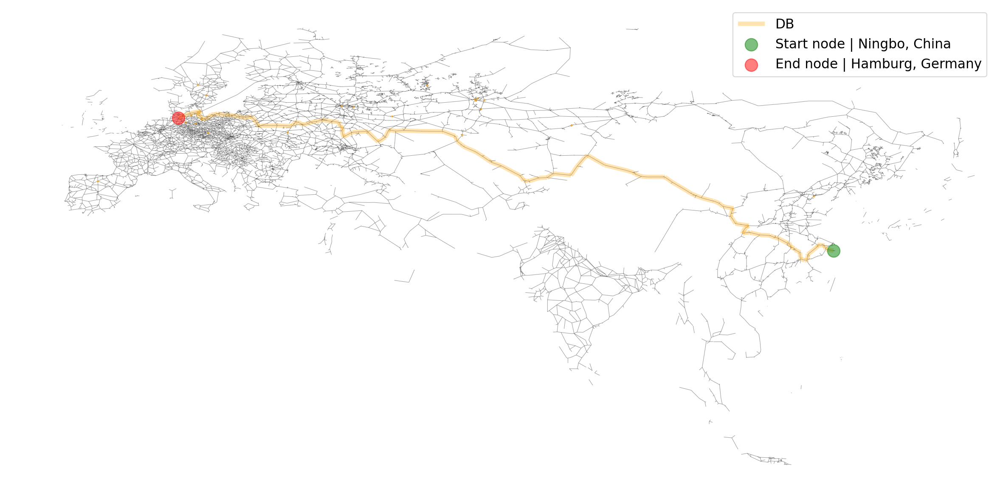

In [372]:
fig, ax = plt.subplots(figsize = (20,10),dpi = 150)

#plt.title("Degree Histogram")
plt.ylabel("Count",fontsize = 15)
plt.xlabel("Degree", fontsize = 15)

ax.tick_params(axis='y', labelsize= 15) 


nx.draw_networkx_nodes(to_highlight, positions, node_size=2,node_color = "orange",alpha = 0.5,dpi=150)
nx.draw_networkx_nodes(normal, positions, node_size=0,node_color = "blue",alpha = 0.1,dpi=150)
nx.draw_networkx_edges(new_graph, positions, alpha=0.4,dpi=150,width = 0.5)
nx.draw_networkx_edges(new_graph, positions,edgelist = edge_id_list_1, 
                       dpi=150,width = 5,alpha = 0.3, ax=ax, edge_color = "orange",label = "DB")

nx.draw_networkx_nodes([node_start], positions, node_size=200,
                       node_color = "green",alpha = 0.5,dpi=150,label = f"Start node | Ningbo, China")
nx.draw_networkx_nodes([node_end], positions, node_size=200,
                       node_color = "red",alpha = 0.5,dpi=150,label = f"End node | Hamburg, Germany")
plt.legend()
plt.legend(fontsize = 15)

# set correct extent based on already project network
left, right = plt.xlim()
y_bottom,y_top = plt.ylim()
print(left,right)
print(y_bottom,y_top)

# hard code it to given axis
ax.set_xlim(left,right-40)
ax.set_ylim(y_bottom,y_top)
plt.axis('off')


plot_name = "shortest_path_db_1.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

**Route number 2 DG**

In [145]:
# list of path nodes from above
to_highlight_route_2 = list_of_paths[1]
# set comparison with all other nodes
normal = set(new_graph.nodes()) - set(to_highlight_route_2)

In [146]:
edge_id_list_2 = []

# try and create edge list for the shortest path
for index,entry in enumerate(to_highlight_route_2[:-1]):
    edge_id = (to_highlight_route_2[index],to_highlight_route_2[index+1])
    edge_id_list_2.append(edge_id)
    #print(edge_id)
    
print("generated edges",len(edge_id_list_2))
print("number of nodes", len(to_highlight_route_2))

# dataframe of nodes part of the path
# find nodes in dataframe
list_of_indeces = []

# find the dataframe index of an edge
for index,entry in enumerate(edge_id_list_2):
    
    temp_counter = 0
    
    try:
        # try arrangement one
        temp_find = gdf_shp_load[gdf_shp_load.edge_id == entry]
        temp_index = temp_find.index[0]
        temp_counter = 1
    except:
        #print("arrangement 1 failed, reversing...")
        
        try:
            # reverse arrangement one by creating a new tuple (tuple cannot be reversed as it is immutable)
            temp_find = gdf_shp_load[gdf_shp_load.edge_id == entry[::-1]]
            temp_index = temp_find.index[0]
            temp_counter = 2
        except:
            temp_counter = 0
            temp_index = "not matched"
            #print("Both arrangements failed")
        
    # decide which index to add to list
    
    if temp_index != "not matched":
        list_of_indeces.append(temp_index)
    else:
        print(f"Index: {index} | Entry: {entry} | neither arrangement matched :(")
    
    
df_route_2_edges = gdf_shp_load.iloc[list_of_indeces,:].copy()
print(df_route_2_edges.shape)

generated edges 276
number of nodes 277
(276, 17)


In [147]:
# calculate summary dataframes for this route
df_temp_summary = df_route_2_edges.set_index("ADMIN")
df_temp_sum = df_temp_summary.groupby(level = 0).sum().round().sort_values(by = "length", ascending = False).copy()
df_temp_count = df_temp_summary.groupby(level = 0).count().round().sort_values(by = "length", ascending = False).copy()

# generate tidied dataframe for this route
df_temp_merge = df_temp_sum.drop("rwdb_rr_id", axis = 1).merge(df_temp_count.loc[:,"rwdb_rr_id"],left_index = True,right_index = True).copy()
df_temp_merge["km per edge"] = df_temp_merge["length"] / df_temp_merge["rwdb_rr_id"] 
df_temp_merge["lpi km per edge"] = df_temp_merge["length_lpi"] / df_temp_merge["rwdb_rr_id"]

df_temp_merge.head(10)

,length,LPI_adjust,length_lpi,rwdb_rr_id,km per edge,lpi km per edge
ADMIN,,,,,,
China,4684841.0,116.0,6252970.0,87,53848.747126,71873.218391
Russia,2767410.0,135.0,4448014.0,84,32945.357143,52952.547619
Kazakhstan,1871327.0,47.0,2923014.0,30,62377.566667,97433.800000
Poland,441376.0,53.0,615071.0,38,11615.157895,16186.078947
Cross_border,411669.0,7.0,411669.0,7,58809.857143,58809.857143
Germany,327943.0,26.0,391403.0,22,14906.500000,17791.045455
Lithuania,251998.0,7.0,338200.0,5,50399.600000,67640.000000
Latvia,92513.0,4.0,131205.0,3,30837.666667,43735.000000


In [149]:
print(df_temp_merge.loc[:,"length"].sum())
print(df_temp_merge.loc[:,"rwdb_rr_id"].sum())

10849077.0
276


-19.306597250000003 188.8179866944445
-12.13542677777778 73.49674622222221


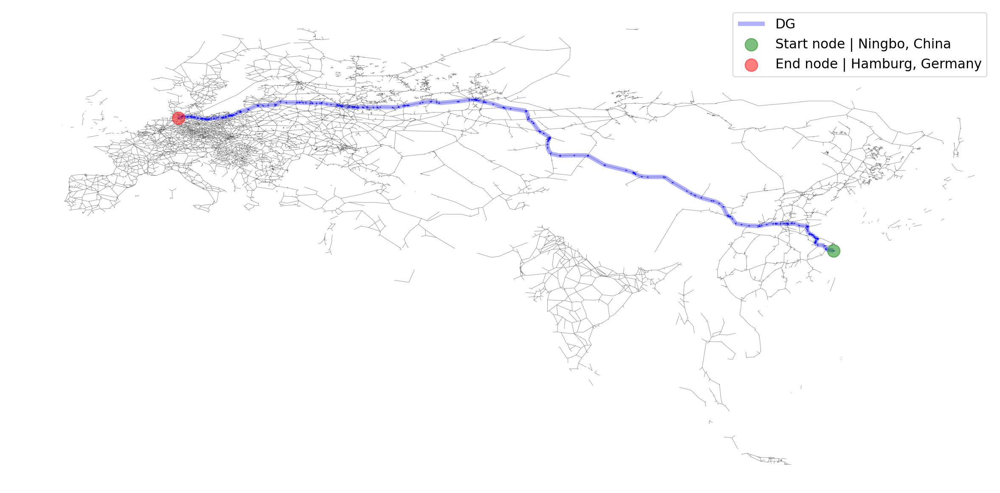

In [370]:
fig, ax = plt.subplots(figsize = (20,10),dpi = 150)

#plt.title("Degree Histogram")
plt.ylabel("Count",fontsize = 15)
plt.xlabel("Degree", fontsize = 15)

ax.tick_params(axis='y', labelsize= 15) 

# draw graph in inset
nx.draw_networkx_nodes(to_highlight_route_2, positions, node_size=1,node_color = "blue",alpha = 0.5,dpi=150)
nx.draw_networkx_nodes(normal, positions, node_size=0,node_color = "blue",alpha = 0.1,dpi=150)
nx.draw_networkx_edges(new_graph, positions, alpha=0.4,dpi=150,width = 0.5)

nx.draw_networkx_edges(new_graph, positions,edgelist = edge_id_list_2, 
                       dpi=150,width = 5,alpha = 0.3, ax=ax, edge_color = "blue",label = "DG")


nx.draw_networkx_nodes([node_start], positions, node_size=200,
                       node_color = "green",alpha = 0.5,dpi=150,label = f"Start node | Ningbo, China")
nx.draw_networkx_nodes([node_end], positions, node_size=200,
                       node_color = "red",alpha = 0.5,dpi=150,label = f"End node | Hamburg, Germany")
plt.legend()
plt.legend(fontsize = 15)

# set correct extent based on already project network
left, right = plt.xlim()
y_bottom,y_top = plt.ylim()
print(left,right)
print(y_bottom,y_top)

# hard code it to given axis
ax.set_xlim(left,right-40)
ax.set_ylim(y_bottom,y_top)
plt.axis('off')

plot_name = "shortest_path_dg_2.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

**Route number 3 DGL**

In [151]:
# list of path nodes from above
to_highlight_route_3 = list_of_paths[2]
# set comparison with all other nodes
normal = set(new_graph.nodes()) - set(to_highlight_route_3)

In [152]:
edge_id_list_3 = []

# try and create edge list for the shortest path
for index,entry in enumerate(to_highlight_route_3[:-1]):
    edge_id = (to_highlight_route_3[index],to_highlight_route_3[index+1])
    edge_id_list_3.append(edge_id)
    #print(edge_id)
    
print("generated edges",len(edge_id_list_3))
print("number of nodes", len(to_highlight_route_3))

# dataframe of nodes part of the path
# find nodes in dataframe
list_of_indeces = []

# find the dataframe index of an edge
for index,entry in enumerate(edge_id_list_3):
    
    temp_counter = 0
    
    try:
        # try arrangement one
        temp_find = gdf_shp_load[gdf_shp_load.edge_id == entry]
        temp_index = temp_find.index[0]
        temp_counter = 1
    except:
        #print("arrangement 1 failed, reversing...")
        
        try:
            # reverse arrangement one by creating a new tuple (tuple cannot be reversed as it is immutable)
            temp_find = gdf_shp_load[gdf_shp_load.edge_id == entry[::-1]]
            temp_index = temp_find.index[0]
            temp_counter = 2
        except:
            temp_counter = 0
            temp_index = "not matched"
            #print("Both arrangements failed")
        
    # decide which index to add to list
    
    if temp_index != "not matched":
        list_of_indeces.append(temp_index)
    else:
        print(f"Index: {index} | Entry: {entry} | neither arrangement matched :(")
    
    
df_route_3_edges = gdf_shp_load.iloc[list_of_indeces,:].copy()
print(df_route_3_edges.shape)

generated edges 276
number of nodes 277
(276, 17)


In [153]:
# calculate summary dataframes for this route
df_temp_summary = df_route_3_edges.set_index("ADMIN")
df_temp_sum = df_temp_summary.groupby(level = 0).sum().round().sort_values(by = "length", ascending = False).copy()
df_temp_count = df_temp_summary.groupby(level = 0).count().round().sort_values(by = "length", ascending = False).copy()

# generate tidied dataframe for this route
df_temp_merge = df_temp_sum.drop("rwdb_rr_id", axis = 1).merge(df_temp_count.loc[:,"rwdb_rr_id"],left_index = True,right_index = True).copy()
df_temp_merge["km per edge"] = df_temp_merge["length"] / df_temp_merge["rwdb_rr_id"] 
df_temp_merge["lpi km per edge"] = df_temp_merge["length_lpi"] / df_temp_merge["rwdb_rr_id"]

df_temp_merge.head(10)

,length,LPI_adjust,length_lpi,rwdb_rr_id,km per edge,lpi km per edge
ADMIN,,,,,,
China,4684841.0,116.0,6252970.0,87,53848.747126,71873.218391
Russia,3249616.0,158.0,5223056.0,98,33159.346939,53296.489796
Cross_border,970436.0,11.0,970436.0,11,88221.454545,88221.454545
Kazakhstan,859313.0,17.0,1342247.0,11,78119.363636,122022.454545
Poland,441376.0,53.0,615071.0,38,11615.157895,16186.078947
Germany,327943.0,26.0,391403.0,22,14906.500000,17791.045455
Lithuania,251998.0,7.0,338200.0,5,50399.600000,67640.000000
Belarus,87288.0,2.0,144042.0,1,87288.000000,144042.000000
Latvia,18390.0,4.0,26081.0,3,6130.000000,8693.666667


In [155]:
print(df_temp_merge.loc[:,"length_lpi"].sum())
print(df_temp_merge.loc[:,"rwdb_rr_id"].sum())

15303506.0
276


-19.306597250000003 188.8179866944445
-12.13542677777778 73.49674622222221


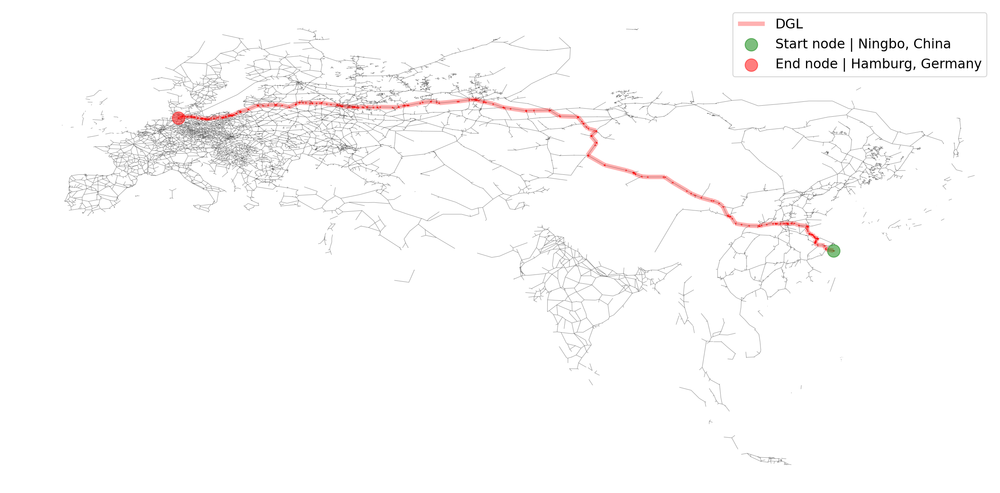

In [394]:
plot_background = False

fig, ax = plt.subplots(figsize = (20,10),dpi = 150)

#plt.title("Degree Histogram")
plt.ylabel("Count",fontsize = 15)
plt.xlabel("Degree", fontsize = 15)

ax.tick_params(axis='y', labelsize= 15) 

# draw graph in inset
plt.axis('off')
nx.draw_networkx_nodes(to_highlight_route_3, positions, node_size=1,node_color = "red",alpha = 0.5,dpi=150)
nx.draw_networkx_nodes(normal, positions, node_size=0,node_color = "red",alpha = 0.1,dpi=150)
nx.draw_networkx_edges(new_graph, positions, alpha=0.4,dpi=150,width = 0.5)

nx.draw_networkx_edges(new_graph, positions,edgelist = edge_id_list_3, 
                       dpi=150,width = 5,alpha = 0.3, ax=ax, edge_color = "red", label = "DGL")


nx.draw_networkx_nodes([node_start], positions, node_size=200,
                       node_color = "green",alpha = 0.5,dpi=150,label = f"Start node | Ningbo, China")
nx.draw_networkx_nodes([node_end], positions, node_size=200,
                       node_color = "red",alpha = 0.5,dpi=150,label = f"End node | Hamburg, Germany")
plt.legend()
plt.legend(fontsize = 15)

# set correct extent based on already project network
left, right = plt.xlim()
y_bottom,y_top = plt.ylim()
print(left,right)
print(y_bottom,y_top)

# hard code it to given axis
ax.set_xlim(left,right-40)
ax.set_ylim(y_bottom,y_top)
plt.axis('off')

if plot_background:
    # then plot world map
    gdf_countries.plot(
    column='ADM0_A3', categorical=True, cmap='Spectral', linewidth=0, edgecolor='0.2',ax=ax,alpha = 0.1)

plot_name = "shortest_path_gdl_3.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

**Routes together**

In [159]:
# define function for things to highlight
# list of path nodes from above
to_highlight_db = list_of_paths[0]
to_highlight_dg = list_of_paths[1]
to_highlight_dgl = list_of_paths[2]

# set comparison with all other nodes
normal = set(new_graph.nodes()) - set(to_highlight_db) - set(to_highlight_dg) - set(to_highlight_dgl)

In [ ]:
node_start = 15793 # Ningbo, China
node_end = 10858 # Hamburg,Germany

4.42556911111111 127.09970922222222
26.80566697222222 58.33044413888888


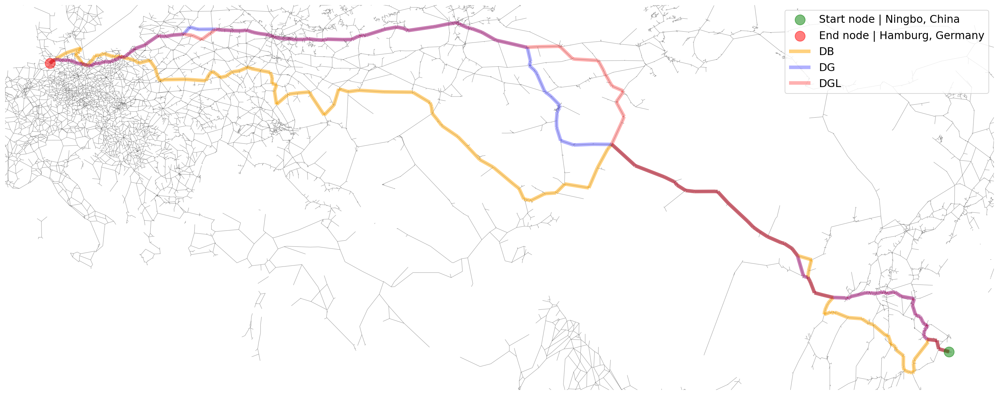

In [375]:
fig, ax = plt.subplots(figsize = (25,10),dpi = 150)
plt.ylabel("Count",fontsize = 15)
plt.xlabel("Degree", fontsize = 15)
ax.tick_params(axis='y', labelsize= 15) 
plt.axis('off')

# Graph content
nx.draw_networkx_nodes(to_highlight_db, positions, node_size=0,node_color = "orange",alpha = 0.5,dpi=150)
nx.draw_networkx_nodes(to_highlight_dg, positions, node_size=0,node_color = "blue",alpha = 0.5,dpi=150)
nx.draw_networkx_nodes(to_highlight_dgl, positions, node_size=0,node_color = "red",alpha = 0.5,dpi=150)

nx.draw_networkx_nodes([node_start], positions, node_size=200,
                       node_color = "green",alpha = 0.5,dpi=150,label = f"Start node | Ningbo, China")
nx.draw_networkx_nodes([node_end], positions, node_size=200,
                       node_color = "red",alpha = 0.5,dpi=150,label = f"End node | Hamburg, Germany")

nx.draw_networkx_edges(new_graph, positions, alpha=0.4,dpi=150,width = 0.5)

# draw custom edge paths
nx.draw_networkx_edges(new_graph, positions,edgelist = edge_id_list_1, 
                       dpi=150,width = 5,alpha = 0.5, ax=ax, edge_color = "orange",label = "DB")
nx.draw_networkx_edges(new_graph, positions,edgelist = edge_id_list_2, 
                       dpi=150,width = 5,alpha = 0.3, ax=ax, edge_color = "blue",label = "DG")
nx.draw_networkx_edges(new_graph, positions,edgelist = edge_id_list_3, 
                       dpi=150,width = 5,alpha = 0.3, ax=ax, edge_color = "red",label = "DGL")

left, right = plt.xlim()
y_bottom,y_top = plt.ylim()
print(left,right)
print(y_bottom,y_top)
ax.set_xlim(left,right)
ax.set_ylim(y_bottom,y_top)

plt.legend(fontsize = 15)

plot_name = "shortest_path_mixed.png"
#plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 300,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

In [168]:
# list of all files
print(os.listdir(path_map))

['ne_10m_railroads_europe_asia', '220b_routes_clean.cpg', '220b_routes_clean.shp', 'ne_10m_railroads', '220b_routes_clean.shx', '220_routes_diagnose.shx', '.DS_Store', '220_routes_clean.dbf', '220_routes_diagnose.cpg', '220_routes_diagnose.shp', 'ne_50m_admin_europe_asia_trim', '220_routes_clean.shx', 'ne_50m_admin_europe_asia', '220_routes_diagnose.dbf', 'ne_10m_admin_0_sovereignty', '220_routes_clean.cpg', '220b_routes_diagnose.prj', '220_routes_clean.shp', 'test_CHN_rrd', '220b_routes_clean.dbf', '220b_routes_clean.prj', 'ne_10m_populated_places', 'eu_asia_rail_country_joint_layer', '220b_routes_diagnose.dbf', 'ne_50m_admin_0_countries', '220_routes_diagnose.prj', 'test_mini', '220b_routes_diagnose.shx', '220b_routes_diagnose.shp', '220b_routes_diagnose.cpg', '220_routes_clean.prj', 'ne_10m_eu_asia_length', 'CH_RU_KZ_Test', 'live_dataset']


In [221]:
# Load shape file folder
folder = "ne_10m_admin_0_sovereignty"
print(os.listdir(f"{path_map}/{folder}"))
file = "ne_10m_admin_0_sovereignty.shp" # from list below insert file to load
full_country_path = f"{path_map}/{folder}/{file}"

gdf_countries = gpd.read_file(full_country_path)

['ne_10m_admin_0_sovereignty.VERSION.txt', 'ne_10m_admin_0_sovereignty.prj', 'ne_10m_admin_0_sovereignty.shx', 'ne_10m_admin_0_sovereignty.cpg', 'ne_10m_admin_0_sovereignty.shp', 'ne_10m_admin_0_sovereignty.README.html', 'ne_10m_admin_0_sovereignty.dbf']


4.42556911111111 127.09970922222222
26.80566697222222 58.33044413888888


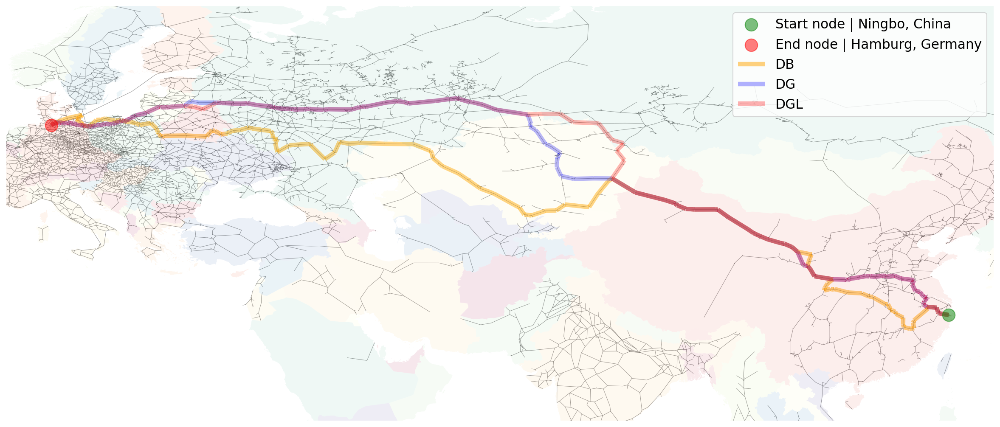

In [396]:
fig, ax = plt.subplots(figsize = (20,10),dpi = 150)
plt.ylabel("Count",fontsize = 15)
plt.xlabel("Degree", fontsize = 15)
ax.tick_params(axis='y', labelsize= 15) 
plt.axis('off')


# Graph content
nx.draw_networkx_nodes(to_highlight_db, positions, node_size=0,node_color = "orange",alpha = 0.5,dpi=150,ax=ax)
nx.draw_networkx_nodes(to_highlight_dg, positions, node_size=0,node_color = "blue",alpha = 0.5,dpi=150,ax=ax)
nx.draw_networkx_nodes(to_highlight_dgl, positions, node_size=0,node_color = "red",alpha = 0.5,dpi=150,ax=ax)

nx.draw_networkx_nodes([node_start], positions, node_size=200,
                       node_color = "green",alpha = 0.5,dpi=150,label = f"Start node | Ningbo, China",ax=ax)
nx.draw_networkx_nodes([node_end], positions, node_size=200,
                       node_color = "red",alpha = 0.5,dpi=150,label = f"End node | Hamburg, Germany",ax=ax)

nx.draw_networkx_edges(new_graph, positions, alpha=0.4,dpi=150,width = 0.5,ax=ax)

# draw custom edge paths
nx.draw_networkx_edges(new_graph, positions,edgelist = edge_id_list_1, 
                       dpi=150,width = 5,alpha = 0.5, ax=ax, edge_color = "orange",label = "DB")
nx.draw_networkx_edges(new_graph, positions,edgelist = edge_id_list_2, 
                       dpi=150,width = 5,alpha = 0.3, ax=ax, edge_color = "blue",label = "DG")
nx.draw_networkx_edges(new_graph, positions,edgelist = edge_id_list_3, 
                       dpi=150,width = 5,alpha = 0.3, ax=ax, edge_color = "red",label = "DGL")

left, right = plt.xlim()
y_bottom,y_top = plt.ylim()
print(left,right)
print(y_bottom,y_top)
ax.set_xlim(left,right)
ax.set_ylim(y_bottom-10,y_top+10)

# Background layer
gdf_countries.plot(
column='ADM0_A3', categorical=True, cmap='Spectral', linewidth=0, edgecolor='0.2',ax=ax,alpha = 0.1)

plt.legend(fontsize = 15)

plot_name = "shortest_path_mixed_background.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 500,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()

**Use code below to insert background layer of map**

In [238]:
break
# set correct extent based on already project network
left, right = plt.xlim()
y_bottom,y_top = plt.ylim()
print(left,right)
print(y_bottom,y_top)

# hard code it to given axis
ax.set_xlim(left,right)
ax.set_ylim(y_bottom,y_top)

# then plot world map
gdf_countries.plot(
column='ADM0_A3', categorical=True, cmap='Spectral', linewidth=0, edgecolor='0.2',ax=ax,alpha = 0.1)

SyntaxError: 'break' outside loop (<ipython-input-238-7d8b67ac0b4e>, line 1)

<a id="ID_part3"></a>
### Part 3 | Front cover visual
|| [0|Top](#ID_top) || [1|Part1](#ID_part1) || [2|Part2](#ID_part2) || [3|Part3](#ID_part3) || [4|Part4](#ID_part4) || [5|Part5](#ID_part5) ||

4.42556911111111 127.09970922222222
26.80566697222222 58.33044413888888


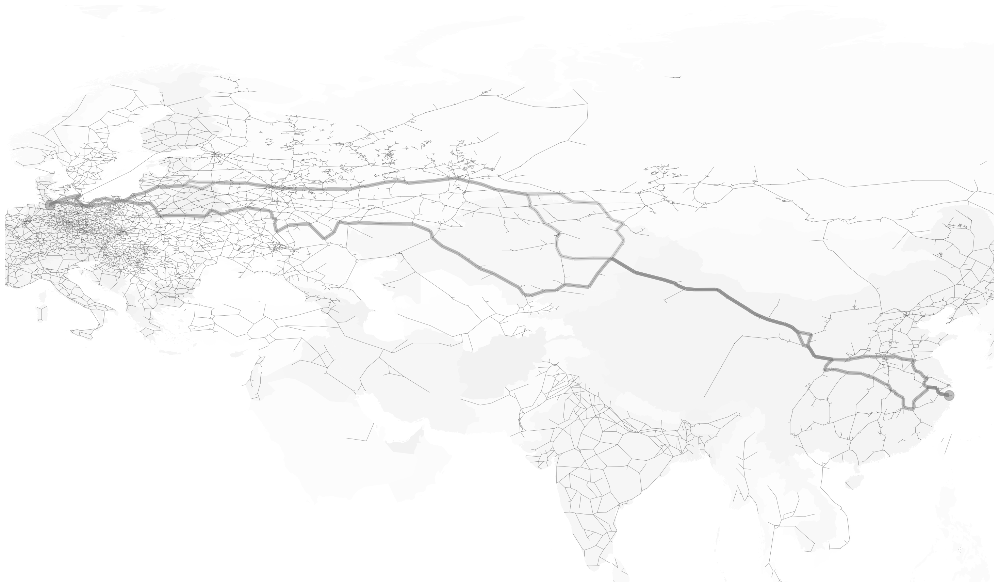

In [452]:
fig, ax = plt.subplots(figsize = (25,20),dpi = 150)
plt.ylabel("Count",fontsize = 15)
plt.xlabel("Degree", fontsize = 15)
ax.tick_params(axis='y', labelsize= 15) 
plt.axis('off')

# Graph content
nx.draw_networkx_nodes(to_highlight_db, positions, node_size=0,node_color = "gray",alpha = 0.5,dpi=150)
nx.draw_networkx_nodes(to_highlight_dg, positions, node_size=0,node_color = "gray",alpha = 0.5,dpi=150)
nx.draw_networkx_nodes(to_highlight_dgl, positions, node_size=0,node_color = "gray",alpha = 0.5,dpi=150)

nx.draw_networkx_nodes([node_start], positions, node_size=200,
                       node_color = "gray",alpha = 0.5,dpi=150,label = f"Start node | Ningbo, China")
nx.draw_networkx_nodes([node_end], positions, node_size=200,
                       node_color = "gray",alpha = 0.5,dpi=150,label = f"End node | Hamburg, Germany")

nx.draw_networkx_edges(new_graph, positions, alpha=0.4,dpi=150,width = 0.5)

# draw custom edge paths
nx.draw_networkx_edges(new_graph, positions,edgelist = edge_id_list_1, 
                       dpi=150,width = 5,alpha = 0.5, ax=ax, edge_color = "gray",label = "DB")
nx.draw_networkx_edges(new_graph, positions,edgelist = edge_id_list_2, 
                       dpi=150,width = 5,alpha = 0.3, ax=ax, edge_color = "gray",label = "DG")
nx.draw_networkx_edges(new_graph, positions,edgelist = edge_id_list_3, 
                       dpi=150,width = 5,alpha = 0.3, ax=ax, edge_color = "gray",label = "DGL")

left, right = plt.xlim()
y_bottom,y_top = plt.ylim()
print(left,right)
print(y_bottom,y_top)
ax.set_xlim(left,right)
ax.set_ylim(y_bottom-20,y_top+20)

# Background layer
gdf_countries.plot(
column='ADM0_A3', categorical=True,cmap='gray', linewidth=0, edgecolor='0.2',ax=ax,alpha = 0.05)

#plt.legend(fontsize = 15)

plot_name = "front_cover.png"
plt.savefig(f"{path_image}{notebook_id}_{plot_name}",dpi = 500,transparent = True,pad_inches = 0,bbox_inches= "tight")
plt.show()